In [5]:
# Imports
import os, pickle, torch
import matplotlib.pyplot as plt
from tqdm import tqdm
from transformers import AutoModelForCausalLM, AutoTokenizer, TextIteratorStreamer
import matplotlib.colors as pltc
import numpy as np
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter
import datetime
import threading
import time

rank = 0
configuration = {
    'epochs' : 20,
    'logpath' : "/home/igli/logs",
    # 'device' : 'cpu',
    'device' : f'cuda:{rank}',
    'batchsize' : 10000,
    'num_clusters' : 128,
    'lr' : 0.0001,
    'optimizer' : 'adamw',
    'loss' : 'l1',
    'weight_decay' : 1,
    'train_log_step' : 10,
    'test_log_step' : 100,
    'residual_scaler' : 10,
    'percentage' : 100,
    'target' : 'teacher', # Either teacher or residual,
    'note': 'test'
}

In [6]:
import shutil

def generate_token_indexed_files_v3(toi, nfiles, file_batch_size=10, skip=0):
    def process_chunks(chi, chb, che, ix, ixpos, probs, embs, batch_no):
        for i in range(len(chi)):
            token_id = chi[i].item()
            if exceeded[token_id] > 15000000:
                continue
            else:
                begin, end = chb[i].item(), che[i].item()
                dump_probs = probs[ix[begin:end]].cpu().numpy().tofile(f"/sanDisk{rank+1}/token_index_data/{token_id}_{batch_no}_probs")
                exceeded[token_id] += end - begin + 1
    def foo(i):
        tensor_list = []
        mask_list   = []
        tidlist, gtlist = [], []
        for file_id in tqdm(range(i, min(i+file_batch_size, nfiles))):
            # apparently there were some file generation mistakes(?)
            aaa1= os.path.getsize(f'/media/igli/LaCie/raw_logits_v3/{fnumbers[file_id]}_student_embeddings_new') # uint8      -1,1024
            aaa2= os.path.getsize(f'/media/igli/LaCie/raw_logits_v3/{fnumbers[file_id]}_student_index_new')      # uint16     -1,   2
            aaa3= os.path.getsize(f'/media/igli/LaCie/raw_logits_v3/{fnumbers[file_id]}_student_probs_new')      # float16    -1, 100
            if aaa1/1024 == aaa2/4 and  aaa3/200 == aaa1/1024:
                index_file = torch.tensor(np.fromfile(f'/sanDisk{rank+1}/raw_logits_v3/{fnumbers[file_id]}_student_index_new', dtype=np.uint16),device=configuration['device']).reshape(-1,2).int()
                tid     = torch.tensor(np.fromfile(f'/sanDisk{rank+1}/raw_logits_v3/{fnumbers[file_id]}_id_t',  dtype=np.int32), device=configuration['device']).reshape(1000, 1024, 100)[index_file[:, 0], index_file[:, 1], :10].reshape(-1,10)
                gt      = torch.tensor(np.fromfile(f'/sanDisk{rank+1}/raw_logits_v3/{fnumbers[file_id]}_id_gt', dtype=np.int32), device=configuration['device']).reshape(1000, 1024     )[index_file[:, 0], index_file[:, 1]]
                
                mask = torch.isin(tid, toi).any(dim=-1) + torch.isin(gt, toi)
                mask_list.append(mask)
                tensor_list.append(index_file[mask])
                tidlist.append(tid[mask].to('cpu'))
                gtlist.append(gt[mask].to('cpu'))
            else:
                print("NEED TO REGENERATE", fnumbers[file_id])
                
        tensor_list = torch.concatenate(tensor_list, dim=0)
        tid_global  = torch.concatenate(tidlist, dim=0).to(configuration['device'])
        gt_global   = torch.concatenate(gtlist, dim=0).to(configuration['device'])
        
        logit_t_global = torch.zeros((tensor_list.shape[0], 100), dtype=torch.float16, device=configuration['device'])
        sprobs_global = torch.zeros((tensor_list.shape[0], 100), dtype=torch.float16, device=configuration['device'])
        
        torch.cuda.empty_cache()
        
        running_prefix = 0
        mi = 0
        for file_id in tqdm(range(i, min(i+file_batch_size, nfiles))):
            aaa1= os.path.getsize(f'/media/igli/LaCie/raw_logits_v3/{fnumbers[file_id]}_student_embeddings_new') # uint8      -1,1024
            aaa2= os.path.getsize(f'/media/igli/LaCie/raw_logits_v3/{fnumbers[file_id]}_student_index_new')      # uint16     -1,   2
            aaa3= os.path.getsize(f'/media/igli/LaCie/raw_logits_v3/{fnumbers[file_id]}_student_probs_new')      # float16    -1, 100
            if aaa1/1024 == aaa2/4 and  aaa3/200 == aaa1/1024:
                mask = mask_list[mi]
                sprobs = torch.tensor(np.fromfile(f'/sanDisk{rank+1}/raw_logits_v3/{fnumbers[file_id]}_student_probs_new', dtype=np.float16), device=configuration['device']).reshape(-1, 100    )
                sprobs = sprobs[mask]
                end = running_prefix + sprobs.shape[0]
                index_file = tensor_list[running_prefix : end]
                assert mask.sum() == index_file.shape[0]
                logit_t = torch.tensor(np.fromfile(f'/sanDisk{rank+1}/raw_logits_v3/{fnumbers[file_id]}_logit_t',  dtype=np.float16), device=configuration['device']).reshape(1000, 1024, 100)[index_file[:, 0], index_file[:, 1]].reshape(-1, 100)
                
                sprobs_global [running_prefix : end] = sprobs
                logit_t_global[running_prefix : end] = logit_t
                running_prefix = end
                mi+=1
        
        torch.cuda.empty_cache()
        normed_logit_global = torch.softmax(logit_t_global, dim=-1)[:, :10].log()
        logit_t_global = logit_t_global[:, :10]

        gt_adjustment = 0
        
        gt_oi = (torch.isin(gt_global, toi) * gt_global).reshape(-1, 1) # Ground truth positions of interest
        # positions where we have a ground truth of interest and no teacher prediction contains it.
        to_inject = ((~(tid_global == gt_oi)).all(dim=-1)  * (gt_oi.reshape(-1) > 0))
        tid_global[to_inject, -1] = gt_oi[to_inject, 0]

        gt_probs = (tid_global == gt_oi).to(sprobs_global.dtype)
        
        torch.cuda.empty_cache()
        
        logit_t_global[(tid_global == gt_oi)] += gt_adjustment
        # logit_t_global = (logit_t_global / logit_t_global[...,:10].sum(dim=-1, keepdims=True))[...,:10]

        toi_subset_mask = torch.isin(tid_global, toi).any(dim=-1)
        
        sprobs_global       = sprobs_global      [toi_subset_mask, :10]
        gt_probs            = gt_probs           [toi_subset_mask]
        logit_t_global      = logit_t_global     [toi_subset_mask]
        normed_logit_global = normed_logit_global[toi_subset_mask]
        tid_global          = tid_global         [toi_subset_mask]
        gt_global           = gt_global          [toi_subset_mask]
        [vals,ix]=tid_global.reshape(-1).sort()
        
        [chunk_token_id,counts]=vals.unique(return_counts=True)
        chunk_end=torch.cumsum(counts,dim=0)
        chunk_beginning=chunk_end.roll(1)
        chunk_beginning[0]=0
        
        select=is_toi[chunk_token_id]
        
        chunk_beginning=chunk_beginning[select]
        chunk_end      =chunk_end      [select]
        chunk_token_id =chunk_token_id [select]
        
        gt_probs_serialized = gt_probs.reshape(-1, 1)
        sprobs_serialized = sprobs_global.reshape(-1, 1)
        tprobs_serialized = logit_t_global.reshape(-1, 1)
        normed_logit_serialized = normed_logit_global.reshape(-1, 1)
        probs_serialized = torch.concatenate((sprobs_serialized, tprobs_serialized, normed_logit_serialized, gt_probs_serialized), dim=-1)
        ix_pos = ix // 10
        del sprobs_global, sprobs_serialized, tprobs_serialized, normed_logit_serialized, gt_probs_serialized, logit_t_global, normed_logit_global

        process_chunks(chunk_token_id, chunk_beginning, chunk_end, ix, ix_pos, probs_serialized, None,file_id//file_batch_size)
    
    print(f"Starting from batch_{skip}")
    is_toi=torch.zeros(256000,device=configuration['device'],dtype=torch.bool)
    is_toi[toi]=1
    for i in range(skip*file_batch_size, nfiles, file_batch_size):
        foo(i)
        torch.cuda.empty_cache()

In [7]:
rank

0

In [8]:
import shutil

def generate_token_indexed_files(toi, nfiles, file_batch_size=10, skip=0):
    def process_chunks(chi, chb, che, ix, ixpos, probs, embs, batch_no):
        for i in range(len(chi)):
            token_id = chi[i].item()
            if exceeded[token_id] > 5000000:
                continue
            else:
                begin, end = chb[i].item(), che[i].item()
                exceeded[token_id] += end - begin + 1
                dump_probs = probs[ix[begin:end]].cpu().numpy().tofile(f"/sanDisk{rank+1}/token_index_data/{token_id}_{batch_no}_probs")
                dump_embs = embs[ixpos[begin:end]].cpu().numpy().tofile(f"/sanDisk{rank+1}/token_index_data/{token_id}_{batch_no}_embed")
    def foo(i):
        tensor_list = []
        mask_list   = []
        tidlist, gtlist = [], []
        for file_id in tqdm(range(i, min(i+file_batch_size, nfiles))):
            # apparently there were some file generation mistakes(?)
            aaa1= os.path.getsize(f'/media/igli/LaCie/raw_logits_v3/{fnumbers[file_id]}_student_embeddings_new') # uint8      -1,1024
            aaa2= os.path.getsize(f'/media/igli/LaCie/raw_logits_v3/{fnumbers[file_id]}_student_index_new')      # uint16     -1,   2
            aaa3= os.path.getsize(f'/media/igli/LaCie/raw_logits_v3/{fnumbers[file_id]}_student_probs_new')      # float16    -1, 100
            if aaa1/1024 == aaa2/4 and  aaa3/200 == aaa1/1024:
                index_file = torch.tensor(np.fromfile(f'/sanDisk{rank+1}/raw_logits_v3/{fnumbers[file_id]}_student_index_new', dtype=np.uint16),device=configuration['device']).reshape(-1,2).int()
                tid     = torch.tensor(np.fromfile(f'/sanDisk{rank+1}/raw_logits_v3/{fnumbers[file_id]}_id_t',  dtype=np.int32), device=configuration['device']).reshape(1000, 1024, 100)[index_file[:, 0], index_file[:, 1], :10].reshape(-1,10)
                gt      = torch.tensor(np.fromfile(f'/sanDisk{rank+1}/raw_logits_v3/{fnumbers[file_id]}_id_gt', dtype=np.int32), device=configuration['device']).reshape(1000, 1024     )[index_file[:, 0], index_file[:, 1]]
                
                mask = torch.isin(tid, toi).any(dim=-1) + torch.isin(gt, toi)
                mask_list.append(mask)
                tensor_list.append(index_file[mask])
                tidlist.append(tid[mask].to('cpu'))
                gtlist.append(gt[mask].to('cpu'))
            else:
                print("NEED TO REGENERATE", fnumbers[file_id])
                
        tensor_list = torch.concatenate(tensor_list, dim=0)
        tid_global  = torch.concatenate(tidlist, dim=0).to(configuration['device'])
        gt_global   = torch.concatenate(gtlist, dim=0).to(configuration['device'])
        
        logit_t_global = torch.zeros((tensor_list.shape[0], 100), dtype=torch.float16, device=configuration['device'])
        embeds_global = torch.zeros((tensor_list.shape[0], 1024), dtype=torch.uint8, device=configuration['device'])
        sprobs_global = torch.zeros((tensor_list.shape[0], 100), dtype=torch.float16, device=configuration['device'])
        
        torch.cuda.empty_cache()
        
        running_prefix = 0
        mi = 0
        for file_id in tqdm(range(i, min(i+file_batch_size, nfiles))):
            aaa1= os.path.getsize(f'/media/igli/LaCie/raw_logits_v3/{fnumbers[file_id]}_student_embeddings_new') # uint8      -1,1024
            aaa2= os.path.getsize(f'/media/igli/LaCie/raw_logits_v3/{fnumbers[file_id]}_student_index_new')      # uint16     -1,   2
            aaa3= os.path.getsize(f'/media/igli/LaCie/raw_logits_v3/{fnumbers[file_id]}_student_probs_new')      # float16    -1, 100
            if aaa1/1024 == aaa2/4 and  aaa3/200 == aaa1/1024:
                mask = mask_list[mi]
                sprobs = torch.tensor(np.fromfile(f'/sanDisk{rank+1}/raw_logits_v3/{fnumbers[file_id]}_student_probs_new', dtype=np.float16), device=configuration['device']).reshape(-1, 100    )
                sprobs = sprobs[mask]
                end = running_prefix + sprobs.shape[0]
                index_file = tensor_list[running_prefix : end]
                assert mask.sum() == index_file.shape[0]
                
                logit_t = torch.tensor(np.fromfile(f'/sanDisk{rank+1}/raw_logits_v3/{fnumbers[file_id]}_logit_t',  dtype=np.float16), device=configuration['device']).reshape(1000, 1024, 100)[index_file[:, 0], index_file[:, 1]].reshape(-1, 100)
                embeds  = torch.tensor(np.fromfile(f'/sanDisk{rank+1}/raw_logits_v3/{fnumbers[file_id]}_student_embeddings_new', dtype=np.uint8), device=configuration['device']).reshape(-1, 1024)
                
                sprobs_global [running_prefix : end] = sprobs
                logit_t_global[running_prefix : end] = logit_t
                embeds_global [running_prefix : end] = embeds[mask]
                running_prefix = end
                mi+=1
        
        torch.cuda.empty_cache()
        logit_t_global = torch.softmax(logit_t_global, dim=-1)[:, :10]

        gt_adjustment = 0.2
        
        gt_oi = (torch.isin(gt_global, toi) * gt_global).reshape(-1, 1) # Ground truth positions of interest
        # positions where we have a ground truth of interest and no teacher prediction contains it.
        to_inject = ((~(tid_global == gt_oi)).all(dim=-1)  * (gt_oi.reshape(-1) > 0))
        tid_global[to_inject, -1] = gt_oi[to_inject, 0]
        
        
        torch.cuda.empty_cache()
        
        logit_t_global[(tid_global == gt_oi)] += gt_adjustment
        logit_t_global = (logit_t_global / logit_t_global[...,:10].sum(dim=-1, keepdims=True))[...,:10]

        toi_subset_mask = torch.isin(tid_global, toi).any(dim=-1)
        
        sprobs_global = sprobs_global[toi_subset_mask, :10]
        logit_t_global= logit_t_global[toi_subset_mask]
        tid_global    = tid_global    [toi_subset_mask]
        gt_global     = gt_global     [toi_subset_mask]
        embeds_global = embeds_global [toi_subset_mask]
        [vals,ix]=tid_global.reshape(-1).sort()
        
        [chunk_token_id,counts]=vals.unique(return_counts=True)
        chunk_end=torch.cumsum(counts,dim=0)
        chunk_beginning=chunk_end.roll(1)
        chunk_beginning[0]=0
        
        select=is_toi[chunk_token_id]
        
        chunk_beginning=chunk_beginning[select]
        chunk_end      =chunk_end      [select]
        chunk_token_id =chunk_token_id [select]
        
        sprobs_serialized = sprobs_global.reshape(-1)
        tprobs_serialized = logit_t_global.reshape(-1)
        probs_serialized = torch.concatenate((sprobs_serialized.unsqueeze(1), tprobs_serialized.unsqueeze(1)), dim=-1)
        ix_pos = ix // 10
        del sprobs_global, sprobs_serialized, tprobs_serialized, logit_t_global

        process_chunks(chunk_token_id, chunk_beginning, chunk_end, ix, ix_pos, probs_serialized, embeds_global,file_id//file_batch_size)
    print(f"Starting from batch_{skip}")
    is_toi=torch.zeros(256000,device=configuration['device'],dtype=torch.bool)
    is_toi[toi]=1
    for i in range(skip*file_batch_size, nfiles, file_batch_size):
        foo(i)
        torch.cuda.empty_cache()
    

In [9]:
fnumbers = sorted(list(set([x[:4] for x in os.listdir("/media/igli/LaCie/raw_logits_v3/")])))
for i in range(len(fnumbers)-1):
    assert int(fnumbers[i]) == i

fnumbers = fnumbers[rank::2]

In [10]:
len(fnumbers)

1331

In [11]:
fnumbers[-1]

'2660'

In [12]:
def generate_token_indexed_files_old(toi, nfiles, file_batch_size=10):
    def process_chunks(chi, chb, che, ix, ixpos, probs, embs, batch_no):
        for i in range(len(chi)):
            token_id = chi[i]
            begin, end = chb[i], che[i]
            probs[ix[begin:end]].cpu().numpy().tofile(f"/media/igli/LaCie/token_index_data/{token_id}_{batch_no}_probs")
            embs[ixpos[begin:end]].cpu().numpy().tofile(f"/media/igli/LaCie/token_index_data/{token_id}_{batch_no}_embed")
            
    def foo(i):
        tensor_list = []
        for file_id in range(i, min(i+file_batch_size, nfiles)):
            tensor_list.append(torch.tensor(np.fromfile(f'/igli/raw_logits_v2/{fnumbers[file_id]}_student_index_new', dtype=np.uint16),device=configuration['device']).reshape(-1,2).int())
            
        tensor_list = torch.concatenate(tensor_list, dim=0)
        
        tid_global = torch.zeros((tensor_list.shape[0], 10), dtype=torch.int, device=configuration['device'])
        logit_t_global = torch.zeros((tensor_list.shape[0], 100), dtype=torch.float16, device=configuration['device'])
        gt_global  = torch.zeros((tensor_list.shape[0]), dtype=torch.int, device=configuration['device'])
        embeds_global = torch.zeros((tensor_list.shape[0], 1024), dtype=torch.uint8, device=configuration['device'])
        sprobs_global = torch.zeros((tensor_list.shape[0], 100), dtype=torch.float16, device=configuration['device'])
        
        torch.cuda.empty_cache()
        
        running_prefix = 0
        for file_id in range(i, min(i+file_batch_size, nfiles)):
            sprobs = torch.tensor(np.fromfile(f'/nvme1tb/{file_id:04d}_student_probs_new', dtype=np.float16), device=configuration['device']).reshape(-1, 100    )
            end = running_prefix + sprobs.shape[0]
            index_file = tensor_list[running_prefix : end]
        
            tid     = torch.tensor(np.fromfile(f'/igli/raw_logits_v2/{fnumbers[file_id]}_id_t',  dtype=np.int32), device=configuration['device']).reshape(1000, 1024, 100)[index_file[:, 0], index_file[:, 1], :10].reshape(-1,10)
            logit_t = torch.tensor(np.fromfile(f'/igli/raw_logits_v2/{fnumbers[file_id]}_logit_t',  dtype=np.float16), device=configuration['device']).reshape(1000, 1024, 100)[index_file[:, 0], index_file[:, 1]].reshape(-1, 100)
            gt      = torch.tensor(np.fromfile(f'/igli/raw_logits_v2/{fnumbers[file_id]}_id_gt', dtype=np.int32), device=configuration['device']).reshape(1000, 1024     )[index_file[:, 0], index_file[:, 1]]
            embeds  = torch.tensor(np.fromfile(f'/igli/raw_logits_v2/{fnumbers[file_id]}_student_embeddings_new', dtype=np.uint8), device=configuration['device']).reshape(-1, 1024)
            
            sprobs_global [running_prefix : end] = sprobs
            tid_global    [running_prefix : end] = tid
            logit_t_global[running_prefix : end] = logit_t
            gt_global     [running_prefix : end] = gt
            embeds_global [running_prefix : end] = embeds
            running_prefix = end
        
        torch.cuda.empty_cache()
        logit_t_global = torch.softmax(logit_t_global, dim=-1)[:, :10]

        gt_adjustment = 0.2
        
        gt_oi = (torch.isin(gt_global, toi) * gt_global).reshape(-1, 1) # Ground truth positions of interest
        # positions where we have a ground truth of interest and no teacher prediction contains it.
        to_inject = ((~(tid_global == gt_oi)).all(dim=-1)  * (gt_oi.reshape(-1) > 0))
        tid_global[to_inject, -1] = gt_oi[to_inject, 0]
        
        
        torch.cuda.empty_cache()
        
        logit_t_global[(tid_global == gt_oi)] += gt_adjustment
        logit_t_global = (logit_t_global / logit_t_global[...,:10].sum(dim=-1, keepdims=True))[...,:10]

        toi_subset_mask = torch.isin(tid_global, toi).any(dim=-1)
        
        sprobs_global = sprobs_global[toi_subset_mask, :10]
        logit_t_global= logit_t_global[toi_subset_mask]
        tid_global    = tid_global    [toi_subset_mask]
        gt_global     = gt_global     [toi_subset_mask]
        embeds_global = embeds_global [toi_subset_mask]
        [vals,ix]=tid_global.reshape(-1).sort()
        
        [chunk_token_id,counts]=vals.unique(return_counts=True)
        chunk_end=torch.cumsum(counts,dim=0)
        chunk_beginning=chunk_end.roll(1)
        chunk_beginning[0]=0
        
        select=is_toi[chunk_token_id]
        chunk_beginning=chunk_beginning[select]
        chunk_end      =chunk_end      [select]
        chunk_token_id =chunk_token_id [select]
        
        sprobs_serialized = sprobs_global.reshape(-1)
        tprobs_serialized = logit_t_global.reshape(-1)
        probs_serialized = torch.concatenate((sprobs_serialized.unsqueeze(1), tprobs_serialized.unsqueeze(1)), dim=-1)
        ix_pos = ix // 10
        del sprobs_global, sprobs_serialized, tprobs_serialized, logit_t_global
        # process_chunks(chunk_token_id, chunk_beginning, chunk_end, ix, ix_pos, probs_serialized, embeds_global,file_id//file_batch_size)
        
    for i in range(0, nfiles, file_batch_size):
        foo(i)
        torch.cuda.empty_cache()

In [13]:
import shutil

def generate_token_indexed_files_v2(toi, nfiles, file_batch_size=10, skip=0):
    def process_chunks(chi, chb, che, ix, ixpos, probs, embs, batch_no):
        for i in range(len(chi)):
            token_id = chi[i].item()
            if exceeded[token_id] > 15000000:
                continue
            else:
                begin, end = chb[i].item(), che[i].item()
                dump_probs = probs[ix[begin:end]].cpu().numpy().tofile(f"/sanDisk{rank+1}/token_index_data/{token_id}_{batch_no}_probs")
                dump_embs = embs[ixpos[begin:end]].cpu().numpy().tofile(f"/sanDisk{rank+1}/token_index_data/{token_id}_{batch_no}_embed")
                exceeded[token_id] += end - begin + 1
    def foo(i):
        tensor_list = []
        mask_list   = []
        tidlist, gtlist = [], []
        for file_id in tqdm(range(i, min(i+file_batch_size, nfiles))):
            # apparently there were some file generation mistakes(?)
            aaa1= os.path.getsize(f'/media/igli/LaCie/raw_logits_v3/{fnumbers[file_id]}_student_embeddings_new') # uint8      -1,1024
            aaa2= os.path.getsize(f'/media/igli/LaCie/raw_logits_v3/{fnumbers[file_id]}_student_index_new')      # uint16     -1,   2
            aaa3= os.path.getsize(f'/media/igli/LaCie/raw_logits_v3/{fnumbers[file_id]}_student_probs_new')      # float16    -1, 100
            if aaa1/1024 == aaa2/4 and  aaa3/200 == aaa1/1024:
                index_file = torch.tensor(np.fromfile(f'/sanDisk{rank+1}/raw_logits_v3/{fnumbers[file_id]}_student_index_new', dtype=np.uint16),device=configuration['device']).reshape(-1,2).int()
                tid     = torch.tensor(np.fromfile(f'/sanDisk{rank+1}/raw_logits_v3/{fnumbers[file_id]}_id_t',  dtype=np.int32), device=configuration['device']).reshape(1000, 1024, 100)[index_file[:, 0], index_file[:, 1], :10].reshape(-1,10)
                gt      = torch.tensor(np.fromfile(f'/sanDisk{rank+1}/raw_logits_v3/{fnumbers[file_id]}_id_gt', dtype=np.int32), device=configuration['device']).reshape(1000, 1024     )[index_file[:, 0], index_file[:, 1]]
                
                mask = torch.isin(tid, toi).any(dim=-1) + torch.isin(gt, toi)
                mask_list.append(mask)
                tensor_list.append(index_file[mask])
                tidlist.append(tid[mask].to('cpu'))
                gtlist.append(gt[mask].to('cpu'))
            else:
                print("NEED TO REGENERATE", fnumbers[file_id])
                
        tensor_list = torch.concatenate(tensor_list, dim=0)
        tid_global  = torch.concatenate(tidlist, dim=0).to(configuration['device'])
        gt_global   = torch.concatenate(gtlist, dim=0).to(configuration['device'])
        
        logit_t_global = torch.zeros((tensor_list.shape[0], 100), dtype=torch.float16, device=configuration['device'])
        embeds_global = torch.zeros((tensor_list.shape[0], 1024), dtype=torch.uint8, device=configuration['device'])
        sprobs_global = torch.zeros((tensor_list.shape[0], 100), dtype=torch.float16, device=configuration['device'])
        
        torch.cuda.empty_cache()
        
        running_prefix = 0
        mi = 0
        for file_id in tqdm(range(i, min(i+file_batch_size, nfiles))):
            aaa1= os.path.getsize(f'/media/igli/LaCie/raw_logits_v3/{fnumbers[file_id]}_student_embeddings_new') # uint8      -1,1024
            aaa2= os.path.getsize(f'/media/igli/LaCie/raw_logits_v3/{fnumbers[file_id]}_student_index_new')      # uint16     -1,   2
            aaa3= os.path.getsize(f'/media/igli/LaCie/raw_logits_v3/{fnumbers[file_id]}_student_probs_new')      # float16    -1, 100
            if aaa1/1024 == aaa2/4 and  aaa3/200 == aaa1/1024:
                mask = mask_list[mi]
                sprobs = torch.tensor(np.fromfile(f'/sanDisk{rank+1}/raw_logits_v3/{fnumbers[file_id]}_student_probs_new', dtype=np.float16), device=configuration['device']).reshape(-1, 100    )
                sprobs = sprobs[mask]
                end = running_prefix + sprobs.shape[0]
                index_file = tensor_list[running_prefix : end]
                assert mask.sum() == index_file.shape[0]
                logit_t = torch.tensor(np.fromfile(f'/sanDisk{rank+1}/raw_logits_v3/{fnumbers[file_id]}_logit_t',  dtype=np.float16), device=configuration['device']).reshape(1000, 1024, 100)[index_file[:, 0], index_file[:, 1]].reshape(-1, 100)
                embeds  = torch.tensor(np.fromfile(f'/sanDisk{rank+1}/raw_logits_v3/{fnumbers[file_id]}_student_embeddings_new', dtype=np.uint8), device=configuration['device']).reshape(-1, 1024)
                
                sprobs_global [running_prefix : end] = sprobs
                logit_t_global[running_prefix : end] = logit_t
                embeds_global [running_prefix : end] = embeds[mask]
                running_prefix = end
                mi+=1
        
        torch.cuda.empty_cache()
        logit_t_global = torch.softmax(logit_t_global, dim=-1)[:, :10]

        gt_adjustment = 0
        
        gt_oi = (torch.isin(gt_global, toi) * gt_global).reshape(-1, 1) # Ground truth positions of interest
        # positions where we have a ground truth of interest and no teacher prediction contains it.
        to_inject = ((~(tid_global == gt_oi)).all(dim=-1)  * (gt_oi.reshape(-1) > 0))
        tid_global[to_inject, -1] = gt_oi[to_inject, 0]

        gt_probs = (tid_global == gt_oi).to(sprobs_global.dtype)
        
        torch.cuda.empty_cache()
        
        logit_t_global[(tid_global == gt_oi)] += gt_adjustment
        logit_t_global = (logit_t_global / logit_t_global[...,:10].sum(dim=-1, keepdims=True))[...,:10]

        toi_subset_mask = torch.isin(tid_global, toi).any(dim=-1)
        
        sprobs_global = sprobs_global [toi_subset_mask, :10]
        gt_probs      = gt_probs      [toi_subset_mask]
        logit_t_global= logit_t_global[toi_subset_mask]
        tid_global    = tid_global    [toi_subset_mask]
        gt_global     = gt_global     [toi_subset_mask]
        embeds_global = embeds_global [toi_subset_mask]
        [vals,ix]=tid_global.reshape(-1).sort()
        
        [chunk_token_id,counts]=vals.unique(return_counts=True)
        chunk_end=torch.cumsum(counts,dim=0)
        chunk_beginning=chunk_end.roll(1)
        chunk_beginning[0]=0
        
        select=is_toi[chunk_token_id]
        
        chunk_beginning=chunk_beginning[select]
        chunk_end      =chunk_end      [select]
        chunk_token_id =chunk_token_id [select]
        
        gt_probs_serialized = gt_probs.reshape(-1)
        sprobs_serialized = sprobs_global.reshape(-1)
        tprobs_serialized = logit_t_global.reshape(-1)
        probs_serialized = torch.concatenate((sprobs_serialized.unsqueeze(1), tprobs_serialized.unsqueeze(1), gt_probs_serialized.unsqueeze(1)), dim=-1)
        ix_pos = ix // 10
        del sprobs_global, sprobs_serialized, tprobs_serialized, gt_probs_serialized, logit_t_global

        process_chunks(chunk_token_id, chunk_beginning, chunk_end, ix, ix_pos, probs_serialized, embeds_global,file_id//file_batch_size)
    print(f"Starting from batch_{skip}")
    is_toi=torch.zeros(256000,device=configuration['device'],dtype=torch.bool)
    is_toi[toi]=1
    for i in range(skip*file_batch_size, nfiles, file_batch_size):
        foo(i)
        torch.cuda.empty_cache()
    

In [14]:
# High Frequency Tokens
toi = torch.tensor(np.fromfile('/home/igli/tokens_of_interest', dtype=np.int32), device=configuration['device'])[:100]

is_toi=torch.zeros(256000,device=configuration['device'],dtype=torch.bool)
is_toi[toi]=1
is_toi

tensor([False, False, False,  ..., False, False, False], device='cuda:0')

In [15]:
exceeded = dict(zip(toi.cpu().numpy(), [0]*toi.size(0)))

In [16]:
import subprocess as s
exceeded = dict()
for token_id in toi:
    token_id = token_id.item()
    filepaths = [*s.run(['find', '/sanDisk1/token_index_data/', '-name', f'{token_id}_*_embed'], capture_output=True).stdout.decode('utf-8').split(), 
                 #*s.run(['find', '/sanDisk2/token_index_data/', '-name', f'{token_id}_*_embed'], capture_output=True).stdout.decode('utf-8').split()
                ]
    filesizes = np.array([int(os.path.getsize(x)/1024) for x in filepaths])
    exceeded[token_id] = filesizes.sum()
    

In [16]:
generate_token_indexed_files_v3(toi, 1000, file_batch_size=10, skip=0)

Starting from batch_0


100%|██████████| 10/10 [00:06<00:00,  1.45it/s]


In [17]:
toi

tensor([32625, 37059], device='cuda:0')

In [10]:
# toi = torch.tensor([2167])
# is_toi=torch.zeros(256000,device=configuration['device'],dtype=torch.bool)
# is_toi[toi]=1
# is_toi

tensor([False, False, False,  ..., False, False, False], device='cuda:0')

In [13]:
# generate_token_indexed_files(toi, len(fnumbers)-1, file_batch_size=120) # From 8 onwards

In [9]:
# plt.plot(sizes[inv].cpu(), '.', alpha=0.2);
# plt.yscale('log')
# plt.figure()
# plt.plot(sizes[inv][:300].cpu(), '.', alpha=0.2);
# plt.yscale('log')
# plt.xscale('log')
# plt.figure()
# plt.plot(sizes[inv][300:].cpu(), '.', alpha=0.2);
# plt.yscale('log')
# plt.xscale('log')


## Training the models

In [2]:
class quantizer_4b_torch:
    
    def quantize(self,a): # it is assumed that the distribution of the values is normal
        is_negative=torch.sign(a)<0
        
        x=torch.sqrt(torch.abs(a))*5.3-2.1
        x=torch.round(x)
        x=torch.clip(x,0,7).to(torch.int8)
        
        x=x+8*is_negative.to(torch.int8)
        return x
    
    def decode(self,x):
        is_negative=x>=8
        a=(( torch.remainder(x,8).to(torch.float16)+2.1)/5.3)**2
        a=a*(1-is_negative.to(torch.int8)*2)
        return a
    
    def quantize_compress(self,a):
        ind=self.quantize(a)
        comp=ind[:,0::2]*16+ind[:,1::2]
        return comp.to(torch.uint8)

    def load_decode(self,data):
        ind=torch.zeros((data.shape[0],data.shape[1]*2),dtype=torch.uint8,device=data.device)
        ind[:,0::2]=torch.floor_divide(data,16)
        ind[:,1::2]=torch.remainder(data,16)
        return self.decode(ind)

class representation_whitening_torch:
    
    def fit(self,a):
        self.mn=a.mean(dim=0)
        
        # low memory covariance calculation
        cov=torch.eye(a.shape[1],dtype=torch.float32,device=a.device)*0
        for i in tqdm(range(0,a.shape[0],10000)):
            aslice=(a[i:i+10000,:].to(torch.float32)-self.mn)
            cov+=( aslice.T@aslice)/a.shape[0]
        
        
        s2,self.q=torch.linalg.eigh(cov)
        self.q=self.q.to(torch.float16)
        self.s=torch.sqrt(s2).to(torch.float16)
        
        if self.s[0]<self.s[-1]:
            self.s=torch.flip(self.s,dims=[0])
            self.q=torch.flip(self.q,dims=[1])
       
    def encode(self,a):
        return (a-self.mn)@self.q /self.s
    
    def decode(self,e):
        return (self.s*e)@self.q.T+self.mn
    
    def rescale(self,e):
        return self.s*e
    
    def save_state_dict(self,path):
        torch.save({'mn':self.mn,'q':self.q,'s':self.s}, path)

    def load_state_dict(self,path):
        data=torch.load(path)
        self.mn=data['mn']
        self.q =data['q' ]
        self.s =data['s' ]
        
    def to(self, d):
        self.mn = self.mn.to(d)
        self.q = self.q.to(d)
        self.s = self.s.to(d)


In [3]:
#Multi
class multi_embedding_old(torch.nn.Module):
    def __init__(self, token_id, device, embedding_size = 2048, number_of_clusters = 2):
        super(multi_embedding, self).__init__()
        self.number_of_clusters=number_of_clusters
        self.embedding_size = embedding_size
        self.normalization_factor = torch.sqrt(torch.tensor(self.embedding_size).to(device))
        self.token_of_interest = token_id
        self.linear1 =torch.nn.Linear(self.embedding_size, self.number_of_clusters, device=device,dtype=torch.float32,bias=True)
        # self.linear2 =torch.nn.Linear(self.number_of_clusters, 1, device=device,dtype=torch.float32,bias=False)
        # with torch.no_grad():
        #     self.linear1.weight.data=(self.linear1.weight*0.01)

        self.device=device
        self.relu=torch.nn.ReLU()
    
    def forward(self, input_embs, student_prob, teacher_prob, weight, percentage=100):
        input_embs = input_embs.to(torch.float32)
        student_prob = student_prob.to(torch.float32)
        teacher_prob = teacher_prob.to(torch.float32)
        scores = self.linear1(input_embs)
        scores/=self.normalization_factor
        ps=self.relu(scores)
        split = int(ps.shape[1] * percentage / 100)
        y = ps[:, :split].sum(dim=-1) - ps[:, split:].sum(dim=-1)
        # y = self.linear2(ps).squeeze()
        # y=torch.maximum(y,-student_prob) # This is not needed anymore i think(?)
        y+=student_prob
        y=torch.clip(y,0,configuration['residual_scaler'])
        # L1
        l1_loss = torch.abs ((teacher_prob - y))
        l1_loss = l1_loss * weight
        # L2
        l2_loss = (teacher_prob - y)**2
        l2_loss = l2_loss * weight
        # KL
        kl_loss = torch.abs(teacher_prob * ((y+1e-9).log() - (teacher_prob+1e-9).log()))
        #default all-zero-l1
        l1_default_zero = torch.abs((teacher_prob - student_prob)) * weight
        #default zero l2
        l2_default_zero = ((teacher_prob - student_prob) ** 2) * weight
        losses = {
            'l1' : l1_loss,
            'l2' : l2_loss,
            'kl' : kl_loss,
            'l1_0':l1_default_zero,
            'l2_0':l2_default_zero,
        }
        
        return y, losses

#Multi
class multi_embedding(torch.nn.Module):
    def __init__(self, token_id, device, embedding_size = 2048, number_of_clusters = 2):
        super(multi_embedding, self).__init__()
        self.number_of_clusters=number_of_clusters
        self.embedding_size = embedding_size
        self.normalization_factor = torch.sqrt(torch.tensor(self.embedding_size).to(device))
        self.token_of_interest = token_id
        self.linear1 =torch.nn.Linear(self.embedding_size, self.number_of_clusters, device=device,dtype=torch.float32,bias=True)
        self.student_factor=torch.nn.Parameter(torch.ones(1,device=device))
        self.final_bias=torch.nn.Parameter(torch.zeros(1,device=device))
        self.student_prob2_factor=torch.nn.Parameter(torch.zeros(1,device=device))
        self.y2_factor=torch.nn.Parameter(torch.zeros(1,device=device))
        self.sy=torch.nn.Parameter(torch.zeros(1,device=device))
        self.nsfactor=torch.nn.Parameter(torch.zeros(1,device=device))
        
        # self.linear2 =torch.nn.Linear(self.embedding_size, self.number_of_clusters//2, device=device,dtype=torch.float32,bias=True)
        
        # self.linear2 =torch.nn.Linear(self.number_of_clusters, 1, device=device,dtype=torch.float32,bias=False)
        # with torch.no_grad():
        #     self.linear1.weight.data=(self.linear1.weight*0.01)

        self.device=device
        self.relu=torch.nn.ReLU()
    
    def forward(self, input_embs, student_prob, teacher_prob, weight, percentage=100):
        input_embs = input_embs.to(torch.float32)
        student_prob = student_prob.to(torch.float32)
        teacher_prob = teacher_prob.to(torch.float32)
        scores = self.linear1(input_embs)
        scores/=self.normalization_factor
        ps=self.relu( scores)
        ns=self.relu(-scores)
        
        split = int(ps.shape[1] * percentage / 100)

        # if np.random.rand()<0.001:
        #     print(self.student_factor)
        #     plt.figure()
        #     plt.imshow(ps[0:100,:].T.detach().cpu().numpy(),cmap='bwr',vmin=-0.01,vmax=0.01)

        #     plt.figure()
        #     plt.imshow((ps.T@ps).detach().cpu().numpy()/1000,cmap='bwr',vmin=-0.00001,vmax=0.00001)
        
        y = ps[:, :split].sum(dim=-1) - ps[:, split:].sum(dim=-1)
        # y = self.linear2(ps).squeeze()
        # y=torch.maximum(y,-student_prob) # This is not needed anymore i think(?)
        # y=torch.exp(y)*student_prob
        # y+=student_prob
        print(y.shape, student_prob.shape)
        y=y+student_prob*self.student_factor+self.final_bias+(student_prob**2*self.student_prob2_factor+y**2*self.y2_factor+student_prob*y*self.sy)*10
        y=torch.clip(y,0,configuration['residual_scaler'])
        # L1
        l1_loss = torch.abs ((teacher_prob - y))
        l1_loss = l1_loss * weight
        # L2
        l2_loss = (teacher_prob - y)**2
        l2_loss = l2_loss * weight
        # KL
        kl_loss = torch.abs(teacher_prob * ((y+1e-9).log() - (teacher_prob+1e-9).log()))
        #default all-zero-l1
        l1_default_zero = torch.abs((teacher_prob - student_prob)) * weight
        #default zero l2
        l2_default_zero = ((teacher_prob - student_prob) ** 2) * weight
        losses = {
            'l1' : l1_loss,
            'l2' : l2_loss,
            'kl' : kl_loss,
            'l1_0':l1_default_zero,
            'l2_0':l2_default_zero,
        }
        
        return y, losses

In [4]:
class multi_embedding(torch.nn.Module):
    def __init__(self, token_id, device, embedding_size = 2048, number_of_clusters = 2):
        super(multi_embedding, self).__init__()
        self.number_of_clusters=number_of_clusters
        self.embedding_size = embedding_size
        self.normalization_factor = torch.sqrt(torch.tensor(self.embedding_size).to(device))
        self.token_of_interest = token_id
        self.linear1 =torch.nn.Linear(self.embedding_size, self.number_of_clusters, device=device,dtype=torch.float32,bias=True)
        self.student_factor=torch.nn.Parameter(torch.ones(1,device=device))
        self.final_bias=torch.nn.Parameter(torch.zeros(1,device=device))
        self.student_prob2_factor=torch.nn.Parameter(torch.zeros(1,device=device))
        self.y2_factor=torch.nn.Parameter(torch.zeros(1,device=device))
        self.sy=torch.nn.Parameter(torch.zeros(1,device=device))
        self.nsfactor=torch.nn.Parameter(torch.zeros(1,device=device))
        
        

        self.device=device
        self.relu=torch.nn.ReLU()
    
    def forward(self, input_embs, student_prob, teacher_prob, weight, percentage=100):
        input_embs = input_embs.to(torch.float32)
        student_prob = student_prob.to(torch.float32)
        teacher_prob = teacher_prob.to(torch.float32)
        scores = self.linear1(input_embs)
        scores/=self.normalization_factor
        ps=self.relu( scores)
        ns=self.relu(-scores)
        
        split = int(ps.shape[1] * percentage / 100)

        y = ps[:, :split].sum(dim=-1) - ps[:, split:].sum(dim=-1)

        y=y+student_prob*self.student_factor+self.final_bias+(student_prob**2*self.student_prob2_factor+y**2*self.y2_factor+student_prob*y*self.sy)*10
        y=torch.clip(y,0,configuration['residual_scaler'])
        # L1
        l1_loss = torch.abs ((teacher_prob - y))
        l1_loss = l1_loss * weight
        # L2
        l2_loss = (teacher_prob - y)**2
        l2_loss = l2_loss * weight
        # KL
        kl_loss = torch.abs(teacher_prob * ((y+1e-9).log() - (teacher_prob+1e-9).log()))
       
        #default all-zero-l1
        l1_default_zero = torch.abs((teacher_prob - student_prob)) * weight
        #default zero l2
        l2_default_zero = ((teacher_prob - student_prob) ** 2) * weight
        losses = {
            'l1' : l1_loss,
            'l2' : l2_loss,
            'kl' : kl_loss,
            'l1_0':l1_default_zero,
            'l2_0':l2_default_zero,
        }
        
        return y, losses

class ParallelTrainer():
    def __init__(self, token_id, configuration, device='cpu', W=None):
        self.token_id = token_id
        self.device  = device
        torch.manual_seed(0)
        self.model = multi_embedding(token_id, self.device, number_of_clusters=configuration['num_clusters'])
        self.optimizer = optim.AdamW(self.model.parameters(), lr=configuration['lr'], betas=(0.9, 0.99), weight_decay=configuration['weight_decay'])
        self.examples_collected = 0
        self.W = W
    def _optimizer_to(self, device):
        for param in self.optimizer.state.values():
            # Not sure there are any global tensors in the state dict
            if isinstance(param, torch.Tensor):
                param.data = param.data.to(device)
                if param._grad is not None:
                    param._grad.data = param._grad.data.to(device)
            elif isinstance(param, dict):
                for subparam in param.values():
                    if isinstance(subparam, torch.Tensor):
                        subparam.data = subparam.data.to(device)
                        if subparam._grad is not None:
                            subparam._grad.data = subparam._grad.data.to(device)
    def to(self, device):
        self.device = device
        self.model = self.model.to(device)
        self._optimizer_to(device)
    
    def step(self, configuration, data, logger, writer, train=True):
        # Book-keepingish
        batchsize = configuration['batchsize']
        loss = configuration['loss']
        model, optimizer = self.model, self.optimizer
        
        # Forward 
        embs, sprob, tprob = data
        embs = self.W.rescale(Q.load_decode(embs))
        weights = torch.ones_like(tprob)
        if train:
            model.train()
            output, losses = model(embs, sprob * configuration['residual_scaler'], tprob * configuration['residual_scaler'], weights, configuration['percentage'])
            # Batched loss
            lval = losses[loss].mean()
            lval.backward()
            self.examples_collected += embs.shape[0]
        else:
            model.eval()
            output, losses = model(embs, sprob * configuration['residual_scaler'], tprob * configuration['residual_scaler'], weights, configuration['percentage'])
            
        if train and self.examples_collected >= batchsize:
            optimizer.step()
            optimizer.zero_grad()
            self.examples_collected = 0
        logger.accumulate(configuration, self.token_id,  embs.shape[0], losses[loss].sum().item(), losses[loss+"_0"].sum().item(), writer, train)
        
class LoggingManager():
    def __init__(self, tokens, log_step):
        self.tokens = tokens
        self.token_index_map = {k:v for v,k in enumerate(tokens)}
        self.log_step = log_step
        
        self.steps_taken = {tok.item():0 for tok in self.tokens}  # This counts the number of (possibly incomplete) batches that go through forward pass
        self.items_seen  = {tok.item():0 for tok in self.tokens}  # This counts the number of examples accumulated
        
        self.batch_losses = {tok.item():0 for tok in self.tokens}
        self.default_losses = {tok.item():0 for tok in self.tokens}
    
    def accumulate(self, configuration, token_id, no_items, batch_loss, default_loss, writer, train=True):
        log_step = self.log_step
        self.batch_losses[token_id] += batch_loss
        self.default_losses[token_id] += default_loss
        self.items_seen[token_id] += no_items 
        self.steps_taken[token_id] += 1
        if train and self.steps_taken[token_id] % log_step == 0:
            self.log(configuration, token_id, writer, train)
            
    def log(self, configuration, token_id, writer, train):
        loss = configuration['loss']
        if train:
            # writer.add_scalar(f'{loss.upper()}/Training Average Batch Loss', self.batch_losses[token_id]/(self.items_seen[token_id]), self.steps_taken[token_id])
            writer.add_scalar(f'{loss.upper()}/Training Batch Loss Ratio', self.batch_losses[token_id]/self.default_losses[token_id], self.steps_taken[token_id])
        else:
            # writer.add_scalar(f'{loss.upper()}/Validation Average Batch Loss', self.batch_losses[token_id]/(self.items_seen[token_id]), self.steps_taken[token_id])
            writer.add_scalar(f'{loss.upper()}/Validation Batch Loss Ratio', self.batch_losses[token_id]/self.default_losses[token_id], self.steps_taken[token_id])
        
        self.batch_losses[token_id] = 0
        self.default_losses[token_id] = 0
        self.items_seen[token_id] = 0

In [11]:
tokenizer = AutoTokenizer.from_pretrained('google/gemma-2b')

In [68]:
Q = quantizer_4b_torch()
# W = representation_whitening_torch()
# W.load_state_dict('/home/igli/wtorch.pth')
# W.to(configuration['device'])
# logger = LoggingManager(toi, 10)
# validation_logger = LoggingManager(toi, 1)

# ML = ModelLoader(toi, logger, device=configuration['device'])
# B = Buckets(toi, configuration['batchsize'], 1024, torch.uint8)
# B.connect_model_loader(ML)

In [69]:
def run_models_training(toi, configuration, W, logger, validation_logger):
    print(configuration)
    for token_id in toi:
        torch.cuda.empty_cache()
        print(token_id)
        configuration['note'] = f"{token_id.item()}_{tokenizer.decode(token_id)}_batchsize_{configuration['batchsize']}"
        writer = SummaryWriter(f"{configuration['logpath']}/{configuration['note']}")
        Trainer = ParallelTrainer(token_id.item(), configuration, device=configuration['device'], W=W)
        # probs = torch.tensor(np.concatenate([np.fromfile(f"/amin/tempigli/{token_id}_{i}_probs", dtype=np.float16).reshape(-1,2) for i in range(4)]), device=configuration['device'])
        # embeds = torch.tensor(np.concatenate([np.fromfile(f"/amin/tempigli/{token_id}_{i}_embed", dtype=np.uint8).reshape(-1,1024) for i in range(4)]), device=configuration['device'])
        probs = torch.tensor(np.concatenate([np.fromfile(f"/media/igli/LaCie/token_index_data/{token_id}_{i}_probs", dtype=np.float16).reshape(-1,2) for i in range(20)]), device=configuration['device'])
        embeds = torch.tensor(np.concatenate([np.fromfile(f"/media/igli/LaCie/token_index_data/{token_id}_{i}_embed", dtype=np.uint8).reshape(-1,1024) for i in range(20)]), device=configuration['device'])

        train_size = int(len(probs) * 0.8) 
        configuration['batchsize'] = min(train_size, configuration['batchsize'])
        train_size = train_size // configuration['batchsize'] * configuration['batchsize']
        
        train_probs, test_probs   = probs [:train_size], probs[train_size:]
        train_embeds, test_embeds = embeds[:train_size],embeds[train_size:]
        train_probs, train_embeds = train_probs.reshape(-1,configuration['batchsize'], 2), train_embeds.reshape(-1, configuration['batchsize'], 1024)
        print(train_embeds.shape, train_probs.shape)
        for epoch in tqdm(range(configuration['epochs'])):
            # Training step
            for i in range(train_probs.shape[0]):
                student_probs, teacher_probs = train_probs[i,:,0], train_probs[i,:,1]
                embeddings = train_embeds[i]
                Trainer.step(configuration, (embeddings, student_probs, teacher_probs), logger, writer, train=True)
            
            # Validation step
            for embeddings, probs in zip(torch.split(test_embeds, configuration['batchsize']), torch.split(test_probs, configuration['batchsize'])):
                Trainer.step(configuration, (embeddings, probs[:, 0], probs[:, 1]), validation_logger, writer, train=False)
                validation_logger.log(configuration, Trainer.token_id, writer, train=False)
        
def process_action(i, toi):
    W = Wlist[i]
    configuration = configurationList[i]
    configuration['device'] = f'cuda:{i}'
    # # Batch size experiment begin
    # configuration['logpath'] = '/home/igli/logs_batch'
    # configuration['batchsize'] = 1000 * (5**i)
    # inner_toi = toi[:5].to(configuration['device'])
    # Batch size experiment end
    logger = logger_list[i]
    validation_logger = validation_logger_list[i]
    inner_toi = toi[50*i:50*(i+1)].cpu().to(configuration['device'])
    print(inner_toi)
    run_models_training(inner_toi, configuration, W, logger, validation_logger)


In [14]:
configuration['epochs'] = 300

In [15]:
configuration

{'epochs': 300,
 'logpath': '/home/igli/logs',
 'device': 'cuda:0',
 'batchsize': 10000,
 'num_clusters': 128,
 'lr': 0.0001,
 'optimizer': 'adamw',
 'loss': 'l1',
 'weight_decay': 1,
 'train_log_step': 10,
 'test_log_step': 100,
 'residual_scaler': 10,
 'percentage': 100,
 'target': 'teacher',
 'note': 'test'}

In [21]:
configuration['logpath'] = '/home/igli/logs_low_freq'

In [22]:
processes = [threading.Thread(target=process_action, args=(i, toi.clone().to(f'cuda:{i}'))) for i in range(4)]

In [23]:
configurationList = [configuration.copy() for _ in range(4)]

In [24]:
logger_list = [LoggingManager(toi, 10) for _ in range(4)]
validation_logger_list = [LoggingManager(toi, 1) for _ in range(4)]

In [116]:
toi = torch.tensor(np.fromfile('/home/igli/tokens_of_interest', dtype=np.int32), device=configuration['device'])[200:]

torch.manual_seed(0)
toi = toi[torch.randperm(len(toi))[:200]] # Getting a random subset of the tokens

is_toi=torch.zeros(256000,device=configuration['device'],dtype=torch.bool)
is_toi[toi]=1
is_toi

tensor([False, False, False,  ..., False, False, False], device='cuda:0')

In [119]:
(torch.tensor(np.fromfile('/home/igli/tokens_of_interest', dtype=np.int32), device=configuration['device'])[200:] == 2167).nonzero()

tensor([[3]], device='cuda:0')

In [26]:
Wlist = [representation_whitening_torch() for i in range(4)]
_=[w.load_state_dict('/home/igli/wtorch.pth') for w in Wlist]
_=[w.to('cpu') for i,w in enumerate(Wlist)]
_=[w.to(f'cuda:{i}') for i,w in enumerate(Wlist)]

## Analyizing the crappy tokens

In [107]:
def get_model(MYTOKEN):
    class quantizer_4b_torch:
        def quantize(self,a): # it is assumed that the distribution of the values is normal
            is_negative=torch.sign(a)<0
            
            x=torch.sqrt(torch.abs(a))*5.3-2.1
            x=torch.round(x)
            x=torch.clip(x,0,7).to(torch.int8)
            
            x=x+8*is_negative.to(torch.int8)
            return x
        
        def decode(self,x):
            is_negative=x>=8
            a=(( torch.remainder(x,8).to(torch.float16)+2.1)/5.3)**2
            a=a*(1-is_negative.to(torch.int8)*2)
            return a
        
        def quantize_compress(self,a):
            ind=self.quantize(a)
            comp=ind[:,0::2]*16+ind[:,1::2]
            return comp.to(torch.uint8)
    
        def load_decode(self,data):
            ind=torch.zeros((data.shape[0],data.shape[1]*2),dtype=torch.uint8,device=data.device)
            ind[:,0::2]=torch.floor_divide(data,16)
            ind[:,1::2]=torch.remainder(data,16)
            return self.decode(ind)
    
    class representation_whitening_torch:
        
        def fit(self,a):
            self.mn=a.mean(dim=0)
            
            # low memory covariance calculation
            cov=torch.eye(a.shape[1],dtype=torch.float32,device=a.device)*0
            for i in tqdm(range(0,a.shape[0],10000)):
                aslice=(a[i:i+10000,:].to(torch.float32)-self.mn)
                cov+=( aslice.T@aslice)/a.shape[0]
            
            
            s2,self.q=torch.linalg.eigh(cov)
            self.q=self.q.to(torch.float16)
            self.s=torch.sqrt(s2).to(torch.float16)
            
            if self.s[0]<self.s[-1]:
                self.s=torch.flip(self.s,dims=[0])
                self.q=torch.flip(self.q,dims=[1])
           
        def encode(self,a):
            return (a-self.mn)@self.q /self.s
        
        def decode(self,e):
            return (self.s*e)@self.q.T+self.mn
        
        def rescale(self,e):
            return self.s*e
        
        def save_state_dict(self,path):
            torch.save({'mn':self.mn,'q':self.q,'s':self.s}, path)
    
        def load_state_dict(self,path):
            data=torch.load(path)
            self.mn=data['mn']
            self.q =data['q' ]
            self.s =data['s' ]
            
        def to(self, d):
            self.mn = self.mn.to(d)
            self.q = self.q.to(d)
            self.s = self.s.to(d)
    
    #Multi
    class multi_embedding(torch.nn.Module):
        def __init__(self, token_id, device, embedding_size = 2048, number_of_clusters = 2):
            super(multi_embedding, self).__init__()
            self.number_of_clusters=number_of_clusters
            self.embedding_size = embedding_size
            self.normalization_factor = torch.sqrt(torch.tensor(self.embedding_size).to(device))
            self.token_of_interest = token_id
            self.linear1 =torch.nn.Linear(self.embedding_size, self.number_of_clusters, device=device,dtype=torch.float32,bias=True)
            self.student_factor=torch.nn.Parameter(torch.ones(1,device=device))
            self.final_bias=torch.nn.Parameter(torch.zeros(1,device=device))
            self.student_prob2_factor=torch.nn.Parameter(torch.zeros(1,device=device))
            self.y2_factor=torch.nn.Parameter(torch.zeros(1,device=device))
            self.sy=torch.nn.Parameter(torch.zeros(1,device=device))
            self.nsfactor=torch.nn.Parameter(torch.zeros(1,device=device))
            
            
    
            self.device=device
            self.relu=torch.nn.ReLU()
        
        def forward(self, input_embs, student_prob, teacher_prob, weight, percentage=100):
            input_embs = input_embs.to(torch.float32)
            student_prob = student_prob.to(torch.float32)
            teacher_prob = teacher_prob.to(torch.float32)
            scores = self.linear1(input_embs)
            scores/=self.normalization_factor
            ps=self.relu( scores)
            ns=self.relu(-scores)
            
            split = int(ps.shape[1] * percentage / 100)
    
            y = ps[:, :split].sum(dim=-1) - ps[:, split:].sum(dim=-1)
            y=y+student_prob*self.student_factor+self.final_bias+(student_prob**2*self.student_prob2_factor+y**2*self.y2_factor+student_prob*y*self.sy)*10
            y=torch.clip(y,0,configuration['residual_scaler'])
            # L1
            l1_loss = torch.abs ((teacher_prob - y))
            l1_loss = l1_loss * weight
            # L2
            l2_loss = (teacher_prob - y)**2
            l2_loss = l2_loss * weight
            # KL
            kl_loss = torch.abs(teacher_prob * ((y+1e-9).log() - (teacher_prob+1e-9).log()))
           
            #default all-zero-l1
            l1_default_zero = torch.abs((teacher_prob - student_prob)) * weight
            #default zero l2
            l2_default_zero = ((teacher_prob - student_prob) ** 2) * weight
            losses = {
                'l1' : l1_loss,
                'l2' : l2_loss,
                'kl' : kl_loss,
                'l1_0':l1_default_zero,
                'l2_0':l2_default_zero,
            }
            
            return y, losses
    
    class ParallelTrainer():
        def __init__(self, token_id, configuration, device='cpu', W=None):
            self.token_id = token_id
            self.device  = device
            torch.manual_seed(0)
            self.model = multi_embedding(token_id, self.device, number_of_clusters=configuration['num_clusters'])
            self.optimizer = optim.AdamW(self.model.parameters(), lr=configuration['lr'], betas=(0.9, 0.99), weight_decay=configuration['weight_decay'])
            self.examples_collected = 0
            self.W = W
        def _optimizer_to(self, device):
            for param in self.optimizer.state.values():
                # Not sure there are any global tensors in the state dict
                if isinstance(param, torch.Tensor):
                    param.data = param.data.to(device)
                    if param._grad is not None:
                        param._grad.data = param._grad.data.to(device)
                elif isinstance(param, dict):
                    for subparam in param.values():
                        if isinstance(subparam, torch.Tensor):
                            subparam.data = subparam.data.to(device)
                            if subparam._grad is not None:
                                subparam._grad.data = subparam._grad.data.to(device)
        def to(self, device):
            self.device = device
            self.model = self.model.to(device)
            self._optimizer_to(device)
        
        def step(self, configuration, data, logger, writer, train=True):
            # Book-keepingish
            batchsize = configuration['batchsize']
            loss = configuration['loss']
            model, optimizer = self.model, self.optimizer
            
            # Forward 
            embs, sprob, tprob = data
            embs = self.W.rescale(Q.load_decode(embs))
            weights = torch.ones_like(tprob)
            if train:
                model.train()
                output, losses = model(embs, sprob * configuration['residual_scaler'], tprob * configuration['residual_scaler'], weights, configuration['percentage'])
                # Batched loss
                lval = losses[loss].mean()
                lval.backward()
                self.examples_collected += embs.shape[0]
            else:
                model.eval()
                output, losses = model(embs, sprob * configuration['residual_scaler'], tprob * configuration['residual_scaler'], weights, configuration['percentage'])
                
            if train and self.examples_collected >= batchsize:
                optimizer.step()
                optimizer.zero_grad()
                self.examples_collected = 0
            logger.accumulate(configuration, self.token_id,  embs.shape[0], losses[loss].sum().item(), losses[loss+"_0"].sum().item(), writer, train)
            
    class LoggingManager():
        def __init__(self, tokens, log_step):
            self.tokens = tokens
            self.token_index_map = {k:v for v,k in enumerate(tokens)}
            self.log_step = log_step
            
            self.steps_taken = {tok.item():0 for tok in self.tokens}  # This counts the number of (possibly incomplete) batches that go through forward pass
            self.items_seen  = {tok.item():0 for tok in self.tokens}  # This counts the number of examples accumulated
            
            self.batch_losses = {tok.item():0 for tok in self.tokens}
            self.default_losses = {tok.item():0 for tok in self.tokens}
        
        def accumulate(self, configuration, token_id, no_items, batch_loss, default_loss, writer, train=True):
            log_step = self.log_step
            self.batch_losses[token_id] += batch_loss
            self.default_losses[token_id] += default_loss
            self.items_seen[token_id] += no_items 
            self.steps_taken[token_id] += 1
            if train and self.steps_taken[token_id] % log_step == 0:
                self.log(configuration, token_id, writer, train)
                
        def log(self, configuration, token_id, writer, train):
            loss = configuration['loss']
            if train:
                # writer.add_scalar(f'{loss.upper()}/Training Average Batch Loss', self.batch_losses[token_id]/(self.items_seen[token_id]), self.steps_taken[token_id])
                writer.add_scalar(f'{loss.upper()}/Training Batch Loss Ratio', self.batch_losses[token_id]/self.default_losses[token_id], self.steps_taken[token_id])
            else:
                # writer.add_scalar(f'{loss.upper()}/Validation Average Batch Loss', self.batch_losses[token_id]/(self.items_seen[token_id]), self.steps_taken[token_id])
                writer.add_scalar(f'{loss.upper()}/Validation Batch Loss Ratio', self.batch_losses[token_id]/self.default_losses[token_id], self.steps_taken[token_id])
            
            self.batch_losses[token_id] = 0
            self.default_losses[token_id] = 0
            self.items_seen[token_id] = 0
     
    def run_models_training(toi, configuration, W, logger, validation_logger):
        print(configuration)
        for token_id in toi:
            print(validation_logger.batch_losses[token_id.item()])
            print(validation_logger.default_losses[token_id.item()])
    
            torch.cuda.empty_cache()
            print(token_id)
            configuration['note'] = f"{token_id.item()}_NEW_{tokenizer.decode(token_id)}_batchsize_{configuration['batchsize']}"
            writer = SummaryWriter(f"{configuration['logpath']}/{configuration['note']}")
            Trainer = ParallelTrainer(token_id.item(), configuration, device=configuration['device'], W=W)
            probs = torch.tensor(np.concatenate([np.fromfile(f"/sanDisk1/token_index_data/{token_id}_{i}_probs", dtype=np.float16).reshape(-1,2) for i in range(15)])[:10000000], device=configuration['device'])
            embeds = torch.tensor(np.concatenate([np.fromfile(f"/sanDisk1/token_index_data/{token_id}_{i}_embed", dtype=np.uint8).reshape(-1,1024) for i in range(15)])[:10000000], device=configuration['device'])
    
            train_size = int(len(probs) * 0.8) 
            configuration['batchsize'] = min(train_size, configuration['batchsize'])
            train_size = train_size // configuration['batchsize'] * configuration['batchsize']
            
            # train_probs, test_probs   = probs [:train_size], probs[train_size:]
            # train_embeds, test_embeds = embeds[:train_size],embeds[train_size:]
            # train_probs, train_embeds = train_probs.reshape(-1,configuration['batchsize'], 2), train_embeds.reshape(-1, configuration['batchsize'], 1024)
            # print(train_embeds.shape, train_probs.shape)
            
            epoch = 0
            torch.manual_seed(0)
    
            while epoch < configuration['epochs'] and logger.steps_taken[token_id.item()] < configuration['steplimit']:
                perm = torch.randperm(embeds.size(0))
    
                # Training step
                for ind in torch.split(perm[:train_size], configuration['batchsize']):
                    student_probs, teacher_probs = probs[ind][:,0], probs[ind][:,1]
                    embeddings = embeds[ind]
                    Trainer.step(configuration, (embeddings, student_probs, teacher_probs), logger, writer, train=True)
                
                # Validation step
                for ind in torch.split(perm[train_size:], configuration['batchsize']):
                    student_probs, teacher_probs = probs[ind][:,0], probs[ind][:,1]
                    embeddings = embeds[ind]
                    Trainer.step(configuration, (embeddings, student_probs, teacher_probs), validation_logger, writer, train=False)
                    validation_logger.log(configuration, Trainer.token_id, writer, train=False)
                
                epoch += 1
            return Trainer
            
    def process_action(i, toi):
        configuration['device'] = f'cuda:{i}'
        
        inner_toi = toi[50*i:50*(i+1)].cpu().to(configuration['device'])
        # inner_toi = inner_toi[torch.randperm(inner_toi.size(0))]
        # inner_toi = inner_toi[(inner_toi==235315).nonzero().item():]
        inner_toi[0] = MYTOKEN
        # inner_toi[1] = 1009
    
        inner_toi = inner_toi[:1]
        print(inner_toi)    
        
        W = representation_whitening_torch()
        W.load_state_dict('/home/igli/whitening_params.pth')
        W.to(configuration['device'])
        logger = LoggingManager(inner_toi, 10)
        validation_logger = LoggingManager(inner_toi, 1)
    
        return run_models_training(inner_toi, configuration, W, logger, validation_logger)
    
    configuration = {
        'epochs' : 300,
        'logpath' : "/home/igli/logtemp",
        # 'device' : 'cpu',
        'device' : 'cuda:0',  # this is changed in process_action function
        'batchsize' : 10000,
        'num_clusters' : 128,
        'lr' : 0.0003,
        'optimizer' : 'adamw',
        'loss' : 'l1',
        'weight_decay' : 1,
        'train_log_step' : 10,
        'test_log_step' : 100,
        'residual_scaler' : 10,
        'percentage' : 100,
        'target' : 'teacher', # Either teacher or residual,
        'note': 'test',
        'steplimit' : 12000
    }
    
    toi = torch.tensor(np.fromfile('/home/igli/tokens_of_interest', dtype=np.int32), device=configuration['device'])[:200]
    torch.manual_seed(0)
    toi = toi[torch.randperm(len(toi))] # Shuffling the contents of TOI (hoping that memory wont be abused if we parallelize)
    
    
    # torch.manual_seed(0)
    # toi = toi[torch.randperm(len(toi))[:200]] # Getting a random subset of the tokens
    
    tokenizer = AutoTokenizer.from_pretrained('google/gemma-2b')
    Q = quantizer_4b_torch()
    
    return process_action(0, toi)

model = get_model(1009)

tensor([1009], device='cuda:0', dtype=torch.int32)
{'epochs': 300, 'logpath': '/home/igli/logtemp', 'device': 'cuda:0', 'batchsize': 10000, 'num_clusters': 128, 'lr': 0.0003, 'optimizer': 'adamw', 'loss': 'l1', 'weight_decay': 1, 'train_log_step': 10, 'test_log_step': 100, 'residual_scaler': 10, 'percentage': 100, 'target': 'teacher', 'note': 'test', 'steplimit': 12000}
0
0
tensor(1009, device='cuda:0', dtype=torch.int32)


In [108]:
model.model

multi_embedding(
  (linear1): Linear(in_features=2048, out_features=128, bias=True)
  (relu): ReLU()
)

In [82]:
bad_tokens = [1331, 1009, 3287, 736, 1277]

In [109]:
token_id = bad_tokens[1]

In [121]:
token_id

1009

In [122]:
emb  = torch.tensor(np.concatenate([np.fromfile(f"/sanDisk1/token_index_data/{token_id}_{i}_embed", dtype=np.uint8).reshape(-1,1024) for i in range(5)]), device='cpu')
prob = torch.tensor(np.concatenate([np.fromfile(f"/sanDisk1/token_index_data/{token_id}_{i}_probs", dtype=np.float16).reshape(-1,2) for i in range(5)]), device='cpu')

In [123]:
emb = emb.to(configuration['device'])
prob = prob.to(configuration['device'])

In [124]:
emb = W.rescale(Q.load_decode(emb))

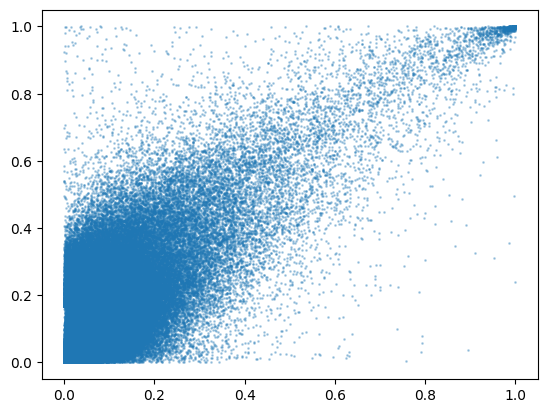

In [125]:
plt.scatter(prob[:,0].cpu(), prob[:,1].cpu(), s=1, alpha=0.3);

In [127]:
emb.shape

torch.Size([878008, 2048])

In [128]:
with torch.no_grad():
    refined, l = model.model(emb, prob[:,0] * configuration['residual_scaler'], prob[:,1] * configuration['residual_scaler'], 1, configuration['percentage'])
                

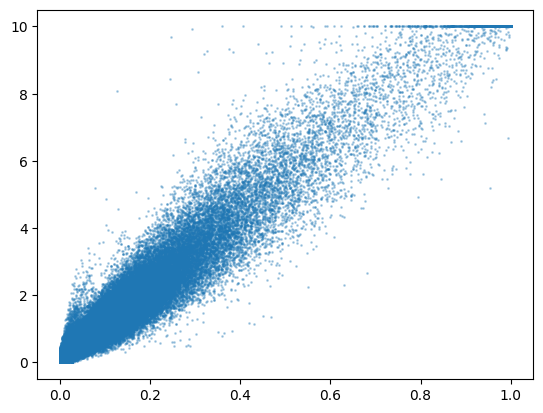

In [129]:
plt.scatter(prob[:, 0].cpu(), refined.cpu(), s=1, alpha=0.3);

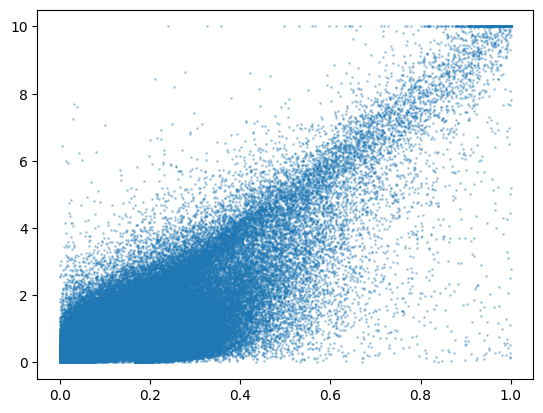

In [130]:
plt.scatter(prob[:, 1].cpu(), refined.cpu(), s=1, alpha=0.3);

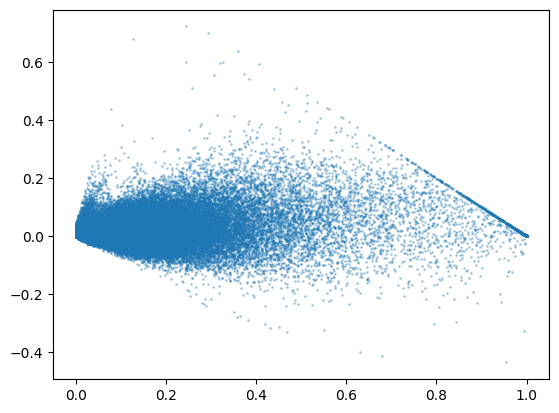

In [131]:
plt.scatter(prob[:,0].cpu(), (refined/10 - prob[:,0]).cpu(), s=1, alpha=0.3) 

In [70]:
W = representation_whitening_torch()
W.load_state_dict('/home/igli/whitening_params.pth')
W.to(configuration['device'])

In [71]:
configuration['logpath'] = "/home/igli/logs_crappy"
configuration['note'] = f"{token_id}_batchsize_{configuration['batchsize']}"

In [72]:
configuration

{'epochs': 300,
 'logpath': '/home/igli/logs_crappy',
 'device': 'cuda:0',
 'batchsize': 10000,
 'num_clusters': 128,
 'lr': 0.0001,
 'optimizer': 'adamw',
 'loss': 'l1',
 'weight_decay': 1,
 'train_log_step': 10,
 'test_log_step': 100,
 'residual_scaler': 10,
 'percentage': 100,
 'target': 'teacher',
 'note': '1009_batchsize_10000'}

In [73]:
writer = SummaryWriter(f"{configuration['logpath']}/{configuration['note']}")
Trainer = ParallelTrainer(token_id, configuration, device=configuration['device'], W=W)

In [74]:
Q = quantizer_4b_torch()
logger = LoggingManager([torch.tensor(token_id)], 10)
validation_logger = LoggingManager([torch.tensor(token_id)], 1)


In [27]:
probs = torch.tensor(np.concatenate([np.fromfile(f"/sanDisk1/token_index_data/{token_id}_{i}_probs", dtype=np.float16).reshape(-1,2) for i in range(20)]), device=configuration['device'])
embeds = torch.tensor(np.concatenate([np.fromfile(f"/sanDisk1/token_index_data/{token_id}_{i}_embed", dtype=np.uint8).reshape(-1,1024) for i in range(20)]), device=configuration['device'])

train_size = int(len(probs) * 0.8) 
configuration['batchsize'] = min(train_size, configuration['batchsize'])
train_size = train_size // configuration['batchsize'] * configuration['batchsize']

# train_probs, test_probs   = probs [:train_size], probs[train_size:]
# train_embeds, test_embeds = embeds[:train_size],embeds[train_size:]
# train_probs, train_embeds = train_probs.reshape(-1,configuration['batchsize'], 2), train_embeds.reshape(-1, configuration['batchsize'], 1024)
# print(train_embeds.shape, train_probs.shape)

In [29]:
embeds.shape, probs.shape

(torch.Size([3525331, 1024]), torch.Size([3525331, 2]))

In [30]:
torch.randperm(embeds.size(0))[:train_size].reshape(-1, configuration['batchsize'])

tensor([[2214936,  959980, 1153376,  ...,  461101,  681098, 3466295],
        [ 450747, 1879810, 2231690,  ..., 3259815, 2986670,  332025],
        [2923328, 1137597, 2812353,  ...,  581785,  465799, 2596492],
        ...,
        [ 467892, 1436180, 2103169,  ...,  454062, 1734254, 2511095],
        [ 446176, 1160839,  859970,  ..., 2702602, 1763638, 2816467],
        [1210874,  137350, 1265582,  ..., 2189778, 2184476, 2337698]])

In [31]:
perm = torch.randperm(embeds.size(0))

In [35]:
ind = (torch.split(perm[:train_size], configuration['batchsize']))[0]

In [42]:
probs.shape[0], embeds.shape[0]

(3525331, 3525331)

In [47]:
embeds[ind]

tensor([[177,  42, 161,  ...,  35,  58,  26],
        [194, 128, 172,  ...,  59, 153,  11],
        [169, 137,  64,  ..., 148, 152, 211],
        ...,
        [184, 140,  26,  ..., 160,  34,  18],
        [193,  25, 152,  ..., 164, 161,   1],
        [157,   0,  57,  ..., 209,   8, 202]], device='cuda:0',
       dtype=torch.uint8)

In [52]:
teacher_probs.shape

torch.Size([10000])

In [75]:
torch.manual_seed(0)
for epoch in tqdm(range(configuration['epochs'])):
    # Training step
    perm = torch.randperm(embeds.size(0))
    for ind in torch.split(perm[:train_size], configuration['batchsize']):
        student_probs, teacher_probs = probs[ind][:,0], probs[ind][:,1]
        embeddings = embeds[ind]
        Trainer.step(configuration, (embeddings, student_probs, teacher_probs), logger, writer, train=True)
    
    # Validation step
    for ind in torch.split(perm[train_size:], configuration['batchsize']):
        student_probs, teacher_probs = probs[ind][:,0], probs[ind][:,1]
        embeddings = embeds[ind]
        Trainer.step(configuration, (embeddings, student_probs, teacher_probs), validation_logger, writer, train=False)
        validation_logger.log(configuration, Trainer.token_id, writer, train=False)

100%|█████████████████████████████████████████| 300/300 [07:32<00:00,  1.51s/it]


## Debugging the Performance

In [11]:
W = representation_whitening_torch()
# W.load_state_dict('/home/igli/wtorch.pth')
W.load_state_dict('/home/igli/whitening_params.pth')
W.to('cpu')
W.to(configuration['device'])

In [32]:
token_id = 1331
data = torch.tensor(np.concatenate([np.fromfile(f"/sanDisk1/token_index_data/{token_id}_{i}_embed", dtype=np.uint8).reshape(-1,1024) for i in range(5)]), device='cpu')
bad_fourbit_nums = torch.zeros(data.shape[0], 2048, dtype=torch.uint8)
bad_fourbit_nums[:, 0::2] = data % 16
bad_fourbit_nums[:, 1::2] = data // 16

In [34]:
token_id_good = 1417
dataGood = torch.tensor(np.concatenate([np.fromfile(f"/sanDisk1/token_index_data/{token_id_good}_{i}_embed", dtype=np.uint8).reshape(-1,1024) for i in range(5)]), device=configuration['device'])
good_fourbit_nums = torch.zeros(dataGood.shape[0], 2048, dtype=torch.uint8)
good_fourbit_nums[:, 0::2] = dataGood % 16
good_fourbit_nums[:, 1::2] = dataGood // 16

<BarContainer object of 16 artists>

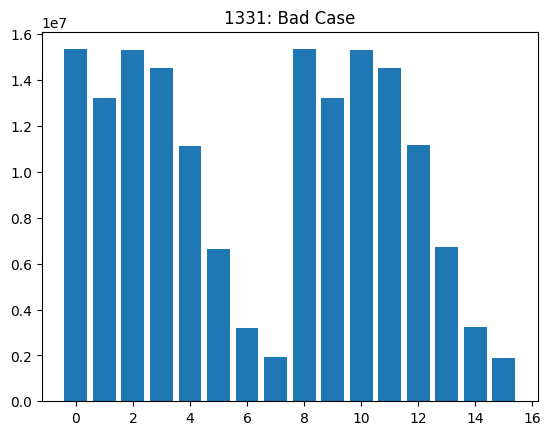

In [33]:
v, c = torch.unique(bad_fourbit_nums, return_counts=True)
plt.title(f"{token_id}: Bad Case")
plt.bar(v, c)

In [78]:
for t in [1009,1331,3287,736,1277]:
    print((toi==t).nonzero().item())

116
149
172
44
165


In [1]:
configuration

NameError: name 'configuration' is not defined

<BarContainer object of 16 artists>

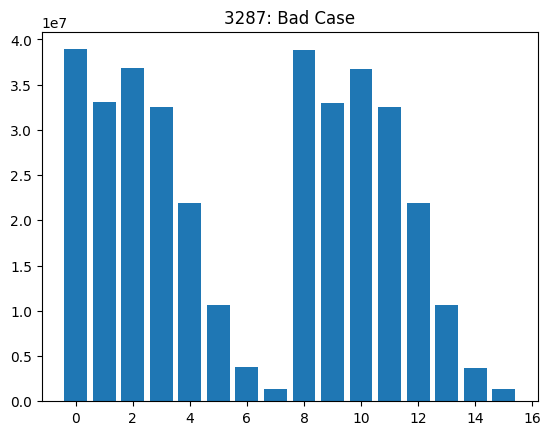

In [31]:
v, c = torch.unique(bad_fourbit_nums, return_counts=True)
plt.title(f"{token_id}: Bad Case")
plt.bar(v, c)

<BarContainer object of 16 artists>

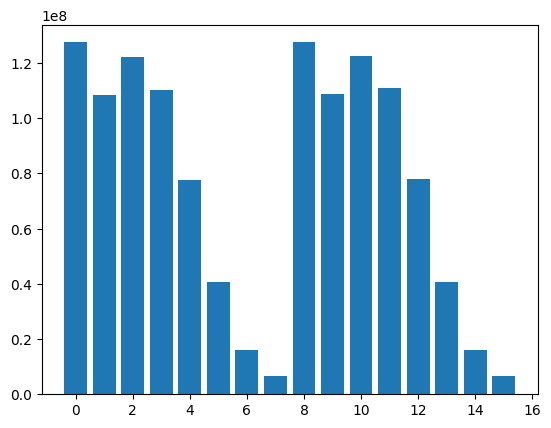

In [18]:
v, c = torch.unique(bad_fourbit_nums, return_counts=True)
plt.bar(v, c)

<BarContainer object of 16 artists>

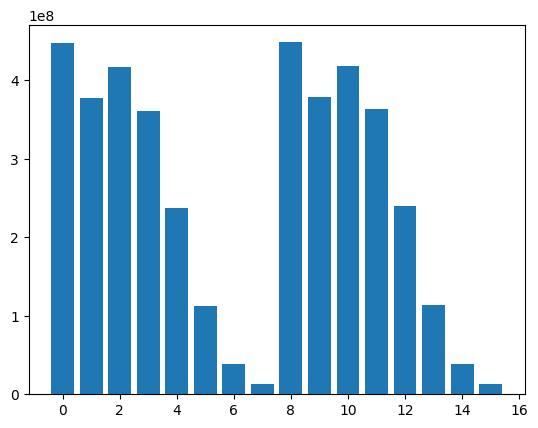

In [27]:
v, c = torch.unique(bad_fourbit_nums, return_counts=True)
plt.bar(v, c)

<BarContainer object of 16 artists>

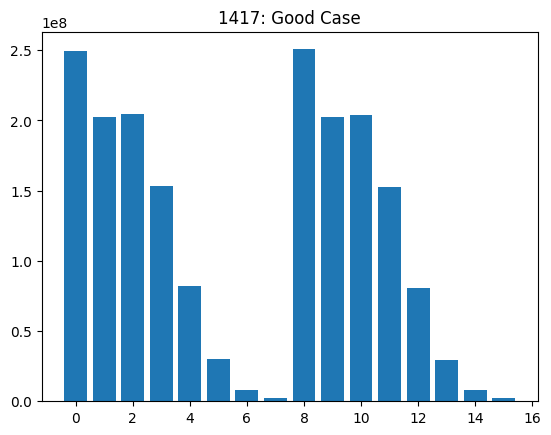

In [35]:
v, c = torch.unique(good_fourbit_nums, return_counts=True)
plt.title(f"{token_id_good}: Good Case")
plt.bar(v, c)

<BarContainer object of 16 artists>

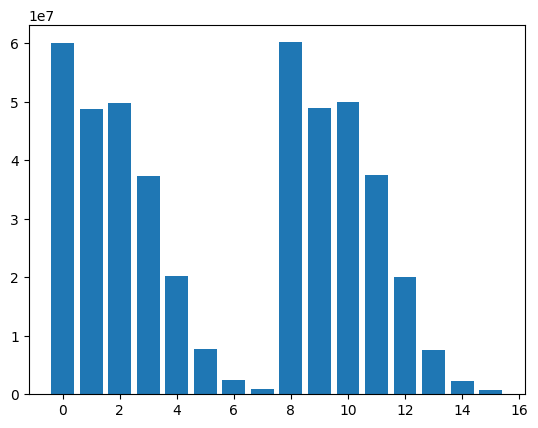

In [28]:
v, c = torch.unique(good_fourbit_nums, return_counts=True)
plt.bar(v, c)

In [62]:
dataOldRaw.std(dim=0)

tensor([0.7339, 0.8345, 0.6768,  ..., 0.8286, 0.7368, 0.8789], device='cuda:0',
       dtype=torch.float16)

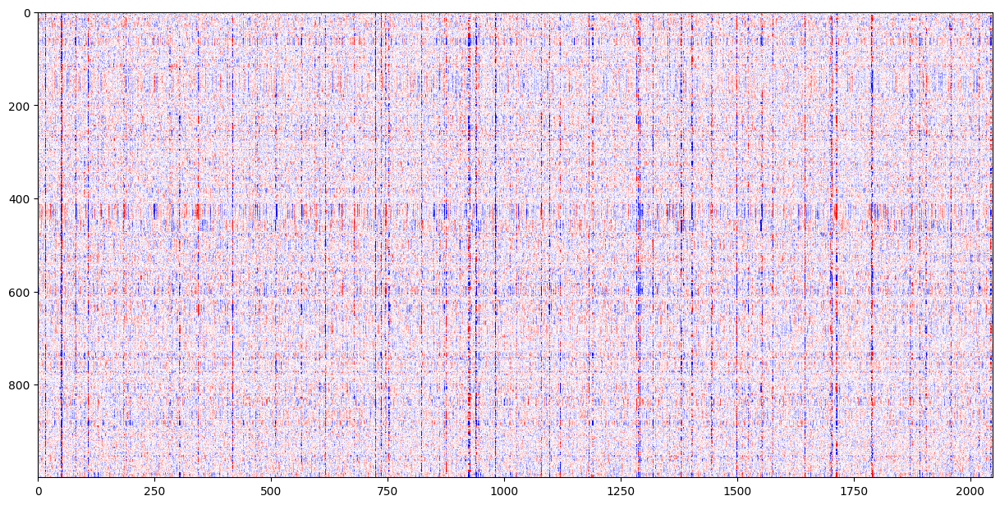

In [33]:
plt.figure(figsize=(15,15))
plt.imshow(dataOldRaw[:1000].cpu().numpy(), 'bwr', vmin=-2, vmax=2)

In [20]:
dataOldRaw.std(dim=0)

tensor([0.7339, 0.8345, 0.6768,  ..., 0.8286, 0.7368, 0.8789], device='cuda:0',
       dtype=torch.float16)

In [12]:
dataOld.shape, dataOldRaw.shape

(torch.Size([660000, 1024]), torch.Size([660000, 2048]))

In [13]:
aw = W.encode(dataOldRaw)

In [14]:
awq = Q.quantize_compress(aw[:1000])

In [15]:
Q.load_decode(awq).shape

torch.Size([1000, 2048])

In [17]:
(dataOld[:1000] - (awq)).sum()

tensor(0, device='cuda:0')

In [47]:
NANtoken   = 163332   # 'abelian'
good_token = 8691     #  ' overall'
bad_token  = 33591    # ' scalar'

In [48]:
configuration['device']

'cuda:0'

In [63]:
dataNan  = torch.tensor(np.fromfile(f'/media/igli/LaCie/token_index_data/{NANtoken}_0_embed', dtype=np.uint8).reshape(-1, 1024), device=configuration['device'])
dataGood = torch.tensor(np.fromfile(f'/media/igli/LaCie/token_index_data/{good_token}_0_embed', dtype=np.uint8).reshape(-1, 1024), device=configuration['device'])
dataBad  = torch.tensor(np.fromfile(f'/media/igli/LaCie/token_index_data/{bad_token}_0_embed', dtype=np.uint8).reshape(-1, 1024), device=configuration['device'])
probNan  = torch.tensor(np.fromfile(f'/media/igli/LaCie/token_index_data/{NANtoken}_0_probs', dtype=np.float16).reshape(-1, 2), device=configuration['device'])
probGood = torch.tensor(np.fromfile(f'/media/igli/LaCie/token_index_data/{good_token}_0_probs', dtype=np.float16).reshape(-1, 2), device=configuration['device'])
probBad  = torch.tensor(np.fromfile(f'/media/igli/LaCie/token_index_data/{bad_token}_0_probs', dtype=np.float16).reshape(-1, 2), device=configuration['device'])

/tmp/ipykernel_3738666/2139790858.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


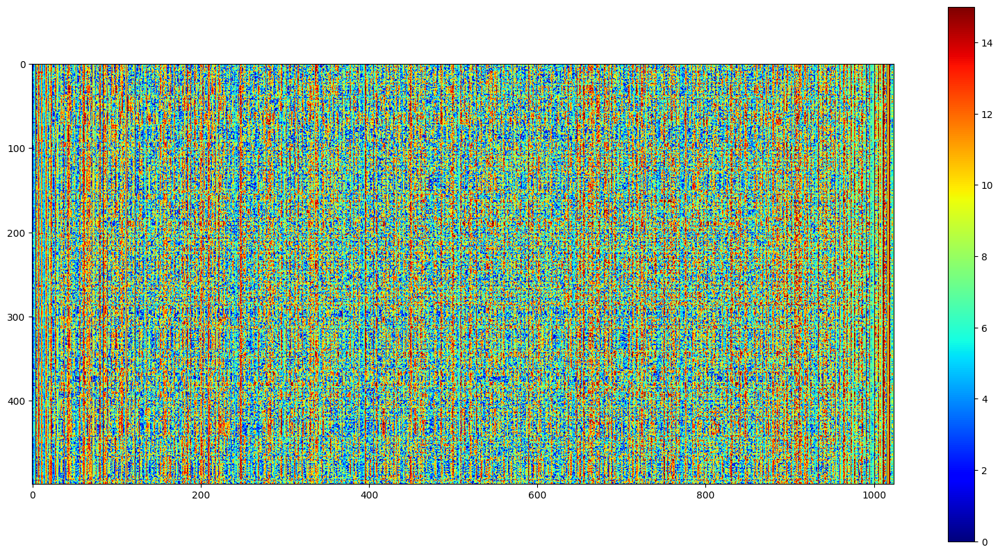

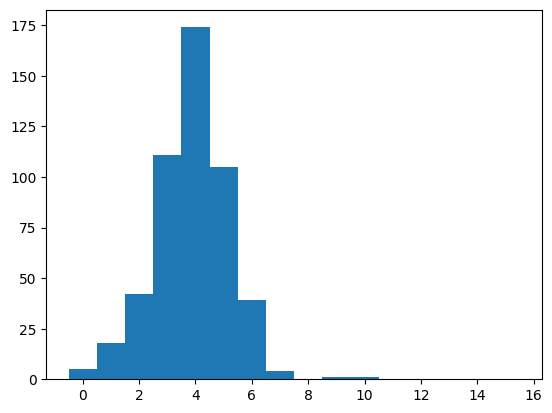

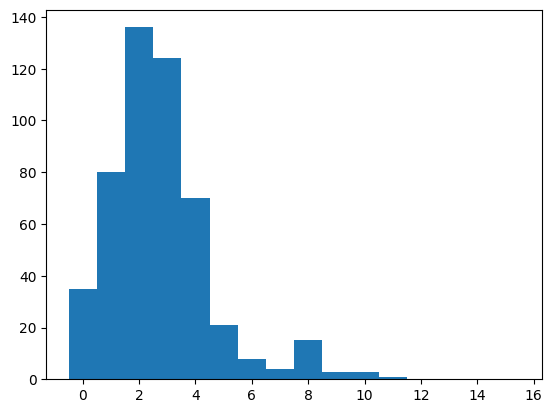

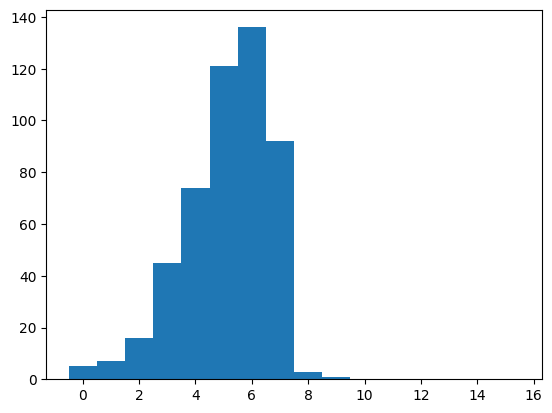

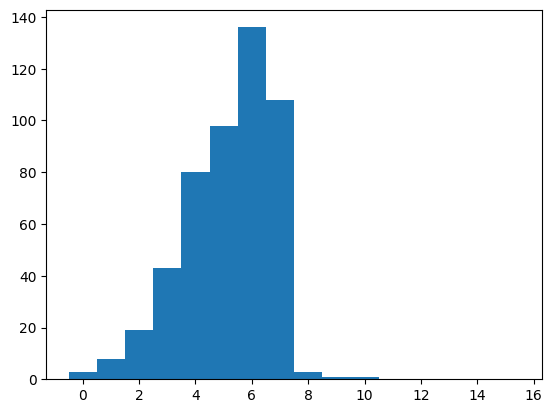

...

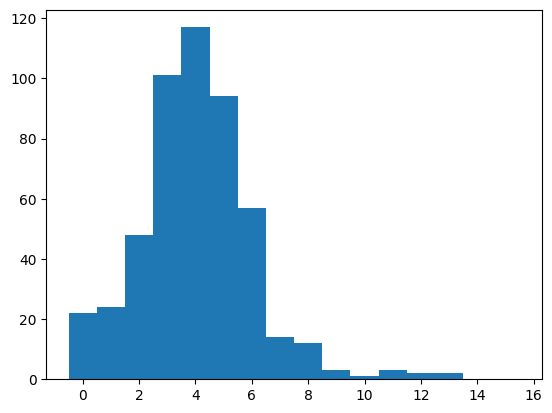

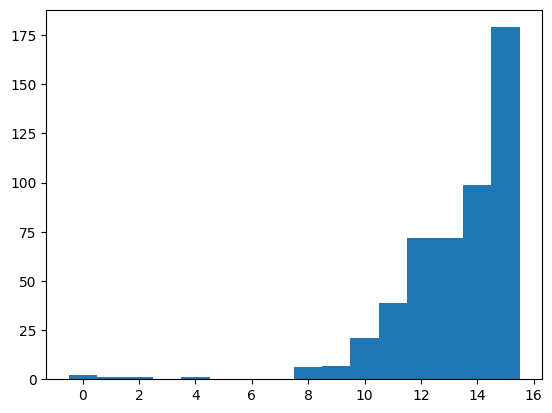

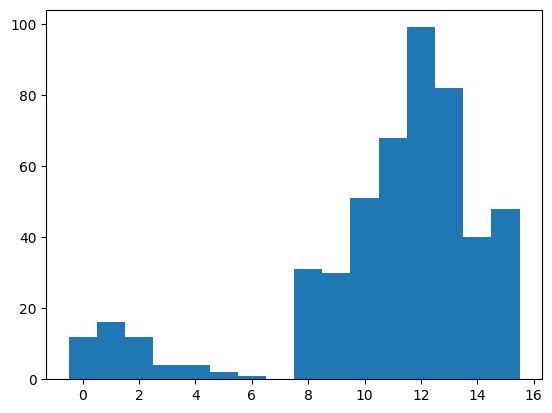

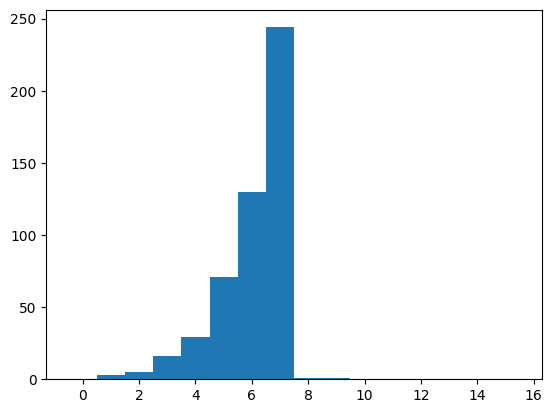

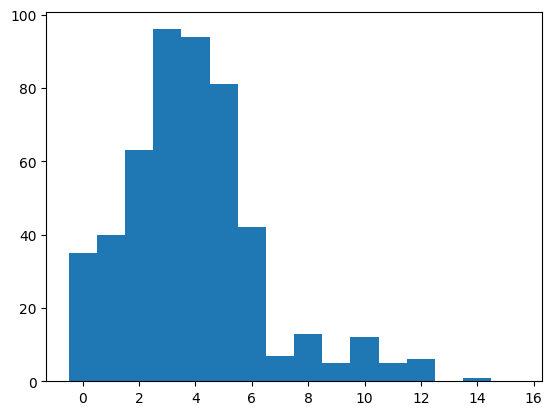

In [74]:
plt.figure(figsize=(20,10))
plt.imshow((dataNan[0:500,:]%16).cpu().numpy(),cmap='jet')
plt.colorbar()
for i in range(20):
    plt.figure()
    plt.hist( (dataNan[0:500,i]%16).cpu().numpy(),bins=np.arange(-0.5,16,1));

In [28]:
probBad.shape, dataBad.shape, probGood.shape, dataGood.shape

(torch.Size([67357, 2]),
 torch.Size([67357, 1024]),
 torch.Size([67629, 2]),
 torch.Size([67629, 1024]))

In [35]:
decoded_good_noscale = (Q.load_decode(dataGood)).cpu().numpy()
decoded_bad_noscale  = (Q.load_decode(dataBad )).cpu().numpy()
decoded_nan_noscale  = (Q.load_decode(dataNan )).cpu().numpy()
decoded_old_noscale  = (Q.load_decode(dataOld )).cpu().numpy()

decoded_good = W.rescale(Q.load_decode(dataGood)).cpu().numpy()
decoded_bad  = W.rescale(Q.load_decode(dataBad )).cpu().numpy()
decoded_nan  = W.rescale(Q.load_decode(dataNan )).cpu().numpy()
decoded_old  = W.rescale(Q.load_decode(dataOld )).cpu().numpy()

In [62]:
decoded_good

array([[-13.875 ,  32.94  ,  17.78  , ...,   0.1887,   0.1537,   0.0823],
       [-19.84  ,  32.94  ,  17.78  , ...,   0.1887,   0.1537,   0.0823],
       [ -2.352 ,  14.805 ,   5.934 , ...,   0.1887,   0.1537,   0.0823],
       ...,
       [ -8.98  ,   6.69  ,   1.555 , ...,   0.1887,   0.1537,   0.0652],
       [-34.97  ,  26.1   ,  -3.39  , ...,   0.1887,   0.1537,   0.0823],
       [-34.97  ,  20.05  ,   1.555 , ...,   0.1887,   0.1537,   0.0823]],
      dtype=float16)

In [ ]:
decoded_bad_noscale.T

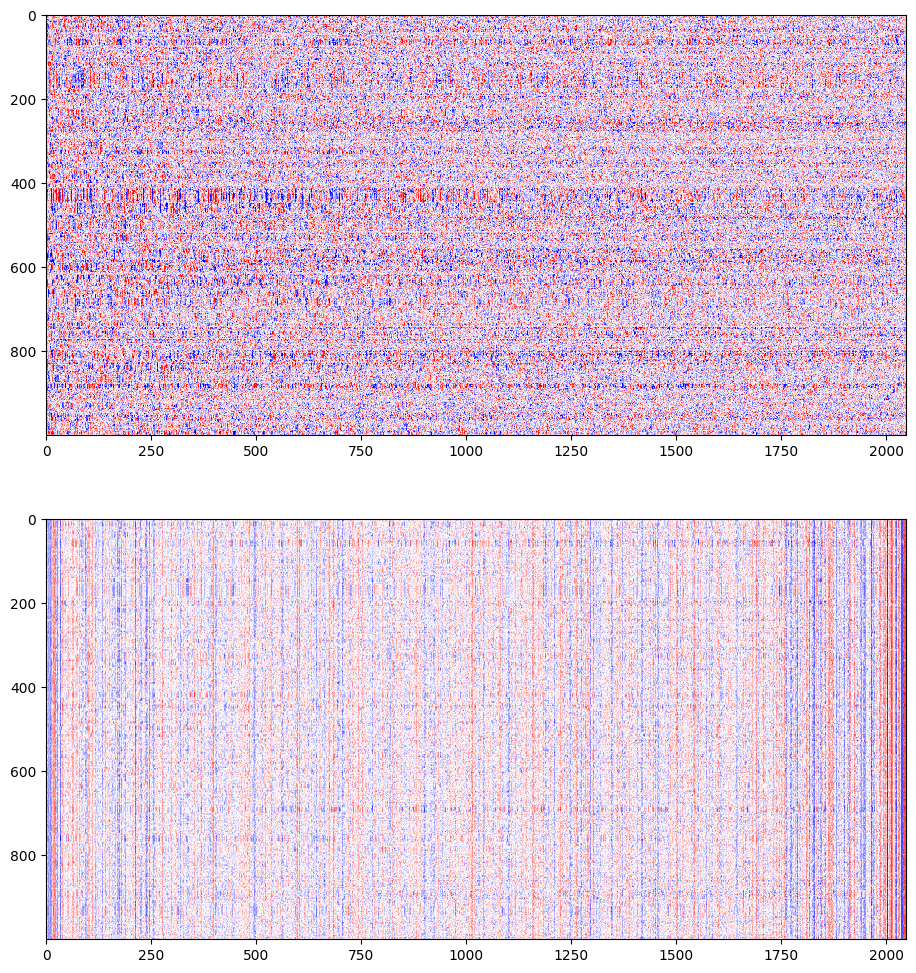

In [37]:
plt.figure(figsize=(25,12))
plt.subplot(2,1,1)
# plt.imshow(decoded_bad_noscale[:100, 700:750], 'bwr')
plt.imshow(decoded_old_noscale[:1000,], 'bwr', vmin=-1,vmax=1)
# plt.colorbar()
plt.subplot(2,1,2)
plt.imshow(decoded_good_noscale[:1000], 'bwr')
# plt.colorbar()

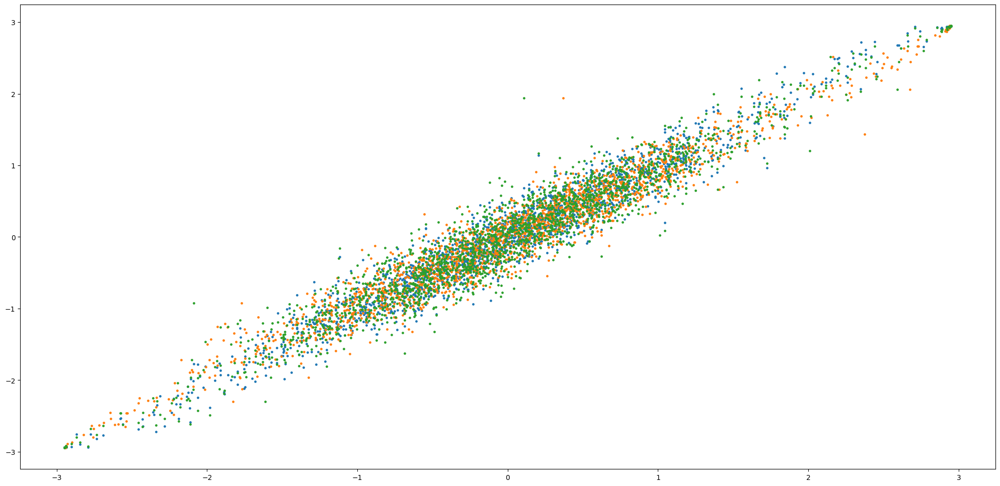

In [33]:
plt.figure(figsize=(25,12))
# # plt.subplot(2,1,1)
# plt.plot(decoded_bad_noscale.mean(axis=0))
# # plt.colorbar()
# # plt.subplot(2,1,2)
# plt.plot(decoded_good_noscale.mean(axis=0) )

plt.scatter(decoded_good_noscale.mean(axis=0),decoded_old_noscale.mean(axis=0), s=6 )
plt.scatter(decoded_old_noscale.mean(axis=0),decoded_bad_noscale.mean(axis=0), s=6 )
plt.scatter(decoded_good_noscale.mean(axis=0),decoded_bad_noscale.mean(axis=0), s=6)
# plt.scatter(decoded_bad_noscale.mean(axis=0),decoded_nan_noscale.mean(axis=0), s=6)

# plt.colorbar()

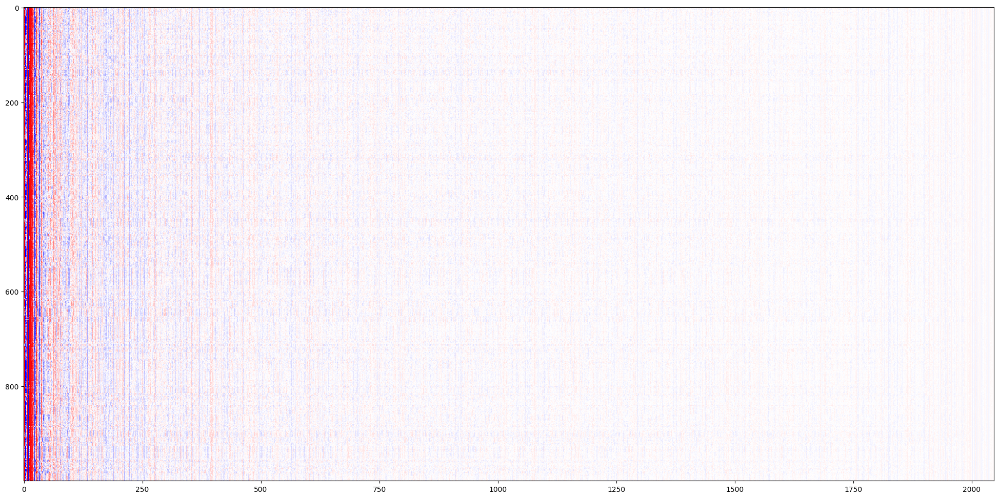

In [94]:
plt.figure(figsize=(25,12))

plt.imshow(decoded_bad[:1000], 'bwr', vmax=10, vmin=-10)


## Retraining the whitening model

In [14]:
LOCATION = "/igli/raw_logits_v2"
def populate_buffer(rank, minibatch_size=8):
    student_model = models[rank]
    size = len(subset)//4
    files = subset[size*rank : size*(rank+1)]
    # files = subset
    embed_buffer = []
    
    for file_no in files:
        ID   = torch.tensor(np.fromfile(os.path.join(LOCATION, f"{file_no:04d}_id_gt"), dtype=np.int32), device=student_model.device).reshape(1000, 1024)
        T_ID = torch.tensor(np.fromfile(os.path.join(LOCATION, f"{file_no:04d}_id_t" ), dtype=np.int32), device='cpu').reshape(1000, 1024, 100)
        
        sentences = np.random.choice(np.arange(1000), 10, replace=False)
        ID = ID[sentences]
        T_ID = T_ID[sentences]
        
        # batch_size = ID.size(0) # This is old_batch_size
        batch_size = 10 # This is old_batch_size
        max_length = ID.size(1)

        start_tokens = torch.tensor(2, dtype=torch.int32).to(student_model.device).repeat(batch_size, 1)
        input_ids = torch.concatenate((start_tokens, ID), dim=1).to(student_model.device)

        
        for minibatch in tqdm(range(0, batch_size, minibatch_size)):
            next_limit = min(minibatch+minibatch_size, batch_size)
            embeddings = student_model.model(input_ids[minibatch:next_limit], return_dict=True,use_cache=False,output_hidden_states=False)['last_hidden_state']
            output = student_model.lm_head(embeddings)[..., :-1, :]
            embeddings = embeddings[..., :-1, :]
            # print(embeddings.shape, embeddings.dtype)
            embed_buffer.append(embeddings.detach().cpu().numpy())
            del embeddings, output
            torch.cuda.empty_cache()
    np.concatenate(embed_buffer, axis=0).tofile(f"rank_{rank}_embeddings_test")
    print(f"Thread {rank} finished")

In [3]:
models = [AutoModelForCausalLM.from_pretrained('google/gemma-2b', torch_dtype=torch.float16,device_map=f'cuda:{i}') for i in range(4)]

Gemma's activation function should be approximate GeLU and not exact GeLU.
Changing the activation function to `gelu_pytorch_tanh`.if you want to use the legacy `gelu`, edit the `model.config` to set `hidden_activation=gelu`   instead of `hidden_act`. See https://github.com/huggingface/transformers/pull/29402 for more details.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [4]:
allfiles = list(set([int(x[:4]) for x in os.listdir(LOCATION)]))

In [5]:
np.random.seed(0)
subset = np.random.choice(allfiles, 100, replace=False)

In [6]:
subset1 = np.random.choice(allfiles, 12, replace=False)

In [7]:
subset, subset1

(array([ 896, 2266, 1142,  501, 2279, 2230,  712, 1424, 1773, 1414, 2194,
        2118, 2276, 2538, 1422,  333, 2577,  564, 2031, 1002, 1255, 1598,
        1864,  716,  692, 2382, 2404, 2115, 1428, 2540, 1704,  156,  722,
        1455,  227,  217, 1267,  117,  982, 1205, 1423,  886,  179,  196,
         711,  402, 2405,   53, 2505,  478, 2621,  306,  558, 1317,  259,
         615, 1165,  546, 1959,  104, 2462, 2085, 2304, 1386, 2132, 2409,
        1136, 1691, 1758, 1368, 2029, 2007, 1663,  868, 1985, 2054,  124,
        1626, 1958, 2019, 1284,  569, 2426, 2349, 1594, 2616,  781,   92,
        2275, 1789, 2501,  427, 1647, 1995, 1760, 1990, 1643, 1606, 1586,
         641]),
 array([  29,  521,  608,  586, 2187, 1546,   42, 1703, 2357,  116, 2387,
        2541]))

In [8]:
subset2 = subset
subset = subset1

In [15]:
threads = [threading.Thread(target=populate_buffer, args=(i, 3)) for i in range(4)]


In [16]:
[thr.start() for thr in threads]


[None, None, None, None]

  0%|                                                     | 0/4 [00:00<?, ?it/s]

 25%|███████████▎                                 | 1/4 [00:00<00:02,  1.17it/s]

 25%|███████████▎                                 | 1/4 [00:00<00:02,  1.22it/s]



 25%|███████████▎                                 | 1/4 [00:01<00:05,  1.76s/it]
Exception in thread Thread-15 (populate_buffer):
Traceback (most recent call last):
  File "/usr/lib/python3.10/threading.py", line 1016, in _bootstrap_inner
    self.run()
  File "/home/igli/.local/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 766, in run_closure
    _threading_Thread_run(self)
  File "/usr/lib/python3.10/threading.py", line 953, in run
    self._target(*self._args, **self._kwargs)
  File "/tmp/ipykernel_3970128/896738739.py", line 28, in populate_buffer
  File "/home/igli/.local/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1532, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
  File "/home/igli/.l

Thread 1 finished
Thread 2 finished



100%|█████████████████████████████████████████████| 4/4 [00:02<00:00,  1.60it/s]


Thread 3 finished


In [9]:
raw_embs_t = np.concatenate([np.fromfile(f"rank_{i}_embeddings", dtype=np.float16).reshape(-1, 1024,2048) for i in range(4)])

In [10]:
raw_embs_t = torch.tensor(raw_embs_t.reshape(-1, 2048), device='cuda:0')

In [12]:
W = representation_whitening_torch()

In [13]:
W.fit(raw_embs_t)

100%|███████████████████████████████████████| 103/103 [00:00<00:00, 1756.19it/s]


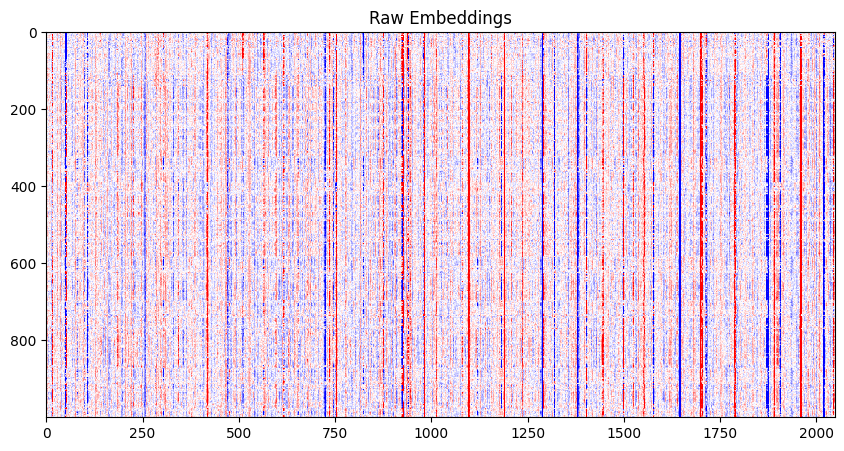

In [16]:
plt.figure(figsize=(15,5))
plt.title("Raw Embeddings")
plt.imshow(raw_embs_t[:1000].cpu().numpy(), 'bwr', vmin=-2, vmax=2)

In [17]:
aw = W.encode(raw_embs_t)

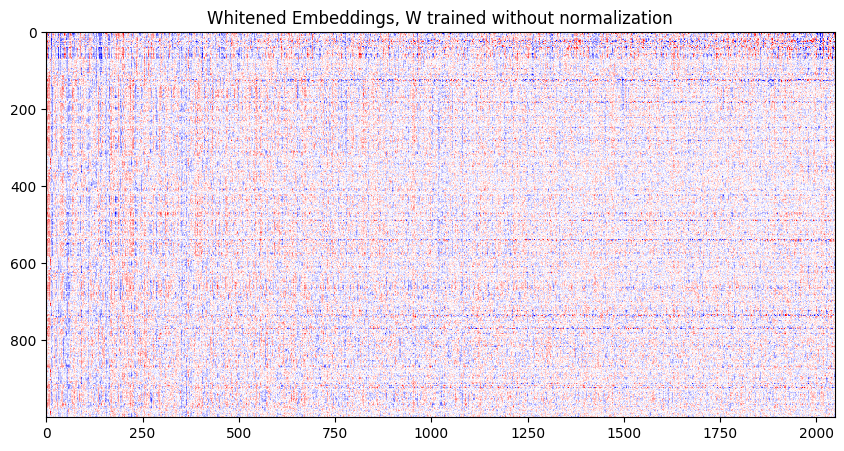

In [19]:
plt.figure(figsize=(15,5))
plt.title("Whitened Embeddings, W trained without normalization")
plt.imshow(aw[:1000].cpu().numpy(), 'bwr', vmin=-2, vmax=2)

In [20]:
w2 = representation_whitening_torch()
n = raw_embs_t - raw_embs_t.mean(dim=0, keepdims=True)
n = n / n.std(dim=0, keepdims=True)

In [34]:
raw_embs_t.mean(dim=0, keepdims=True).shape

torch.Size([1, 2048])

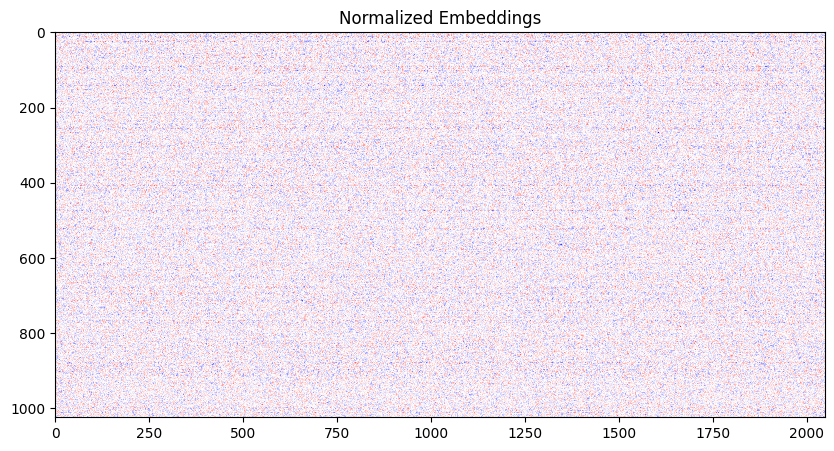

In [40]:
plt.figure(figsize=(15,5))
plt.title("Normalized Embeddings")
plt.imshow(n[50::1000].cpu().numpy(), 'bwr', vmin=-2, vmax=2)

100%|██████████████████████████████████████| 103/103 [00:00<00:00, 14793.96it/s]


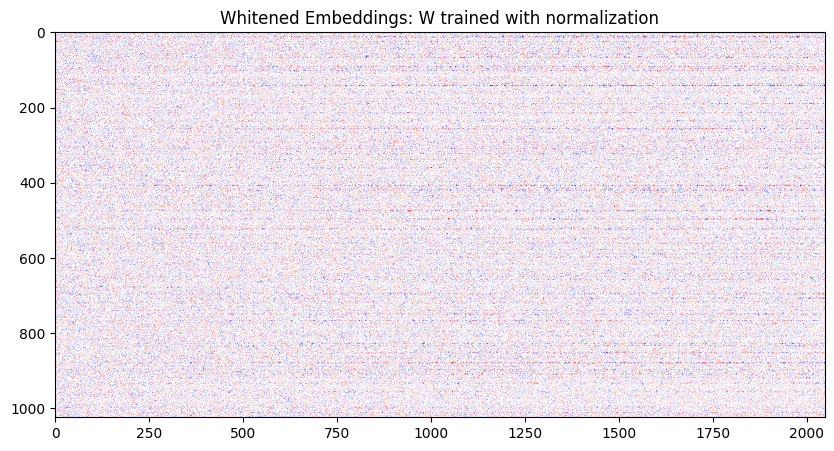

In [41]:
w2.fit(n)
plt.figure(figsize=(15,5))
plt.title("Whitened Embeddings: W trained with normalization")
plt.imshow(w2.encode(n[50::1000]).cpu().numpy(), 'bwr', vmin=-2, vmax=2)

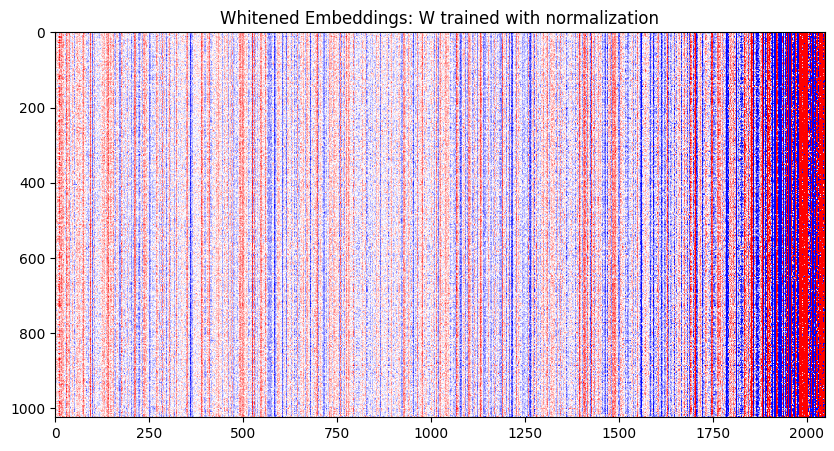

In [43]:
plt.figure(figsize=(15,5))
plt.title("Whitened Embeddings: W trained with normalization")
plt.imshow(w2.encode(raw_embs_t[::1000]).cpu().numpy(), 'bwr', vmin=-2, vmax=2)

In [22]:
raw_embs_test = np.concatenate([np.fromfile(f"rank_{i}_embeddings_test", dtype=np.float16).reshape(-1, 1024,2048) for i in range(4)])
raw_embs_test = torch.tensor(raw_embs_test.reshape(-1, 2048), device='cuda:0')


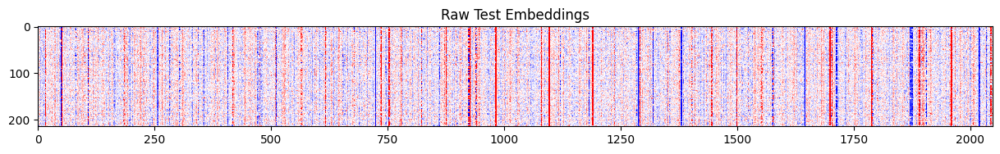

In [44]:
plt.figure(figsize=(15,5))
plt.title("Raw Test Embeddings")
plt.imshow(raw_embs_test[50::1000].cpu().numpy(), 'bwr', vmin=-2, vmax=2)

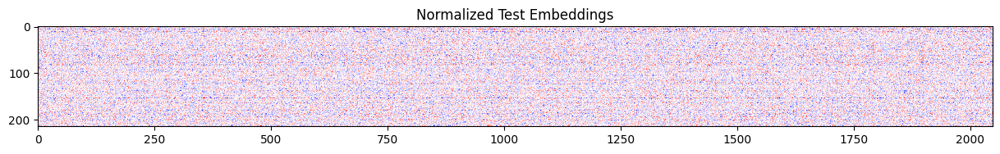

In [45]:
plt.figure(figsize=(15,10))
ntest = raw_embs_test - raw_embs_test.mean(dim=0, keepdims=True)
ntest = ntest / ntest.std(dim=0, keepdims=True)
plt.title("Normalized Test Embeddings")
plt.imshow(ntest[50::1000].cpu().numpy(), 'bwr', vmin=-2, vmax=2)

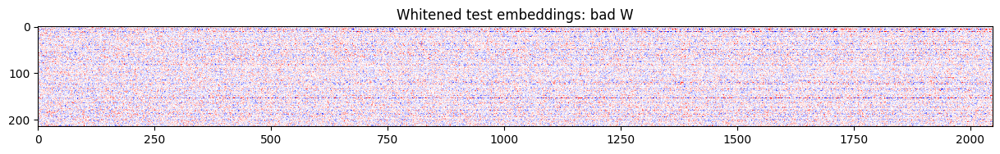

In [46]:
plt.figure(figsize=(15,5))
plt.title("Whitened test embeddings: bad W")
plt.imshow(W.encode(raw_embs_test[50::1000]).cpu().numpy(), 'bwr', vmin=-2, vmax=2)

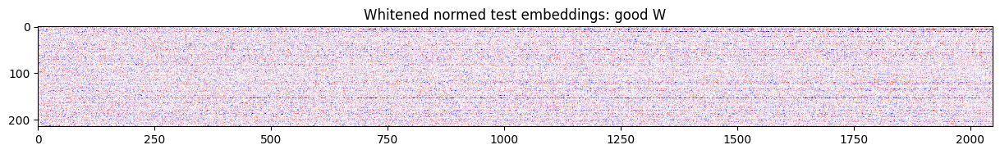

In [49]:
plt.figure(figsize=(15,5))
plt.title("Whitened normed test embeddings: good W")
plt.imshow(w2.encode(ntest[50::1000]).cpu().numpy(), 'bwr', vmin=-2, vmax=2)

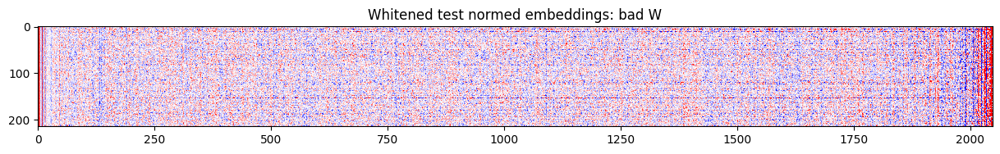

In [47]:
plt.figure(figsize=(15,5))
plt.title("Whitened test normed embeddings: bad W")
plt.imshow(W.encode(ntest[50::1000]).cpu().numpy(), 'bwr', vmin=-2, vmax=2)

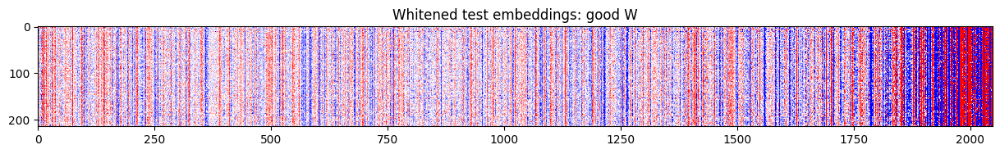

In [48]:
plt.figure(figsize=(15,5))
plt.title("Whitened test embeddings: good W")
plt.imshow(w2.encode(raw_embs_test[50::1000]).cpu().numpy(), 'bwr', vmin=-2, vmax=2)

In [50]:
os.getcwd()

'/home/igli/whitening'

In [51]:
W.mn = W.mn.cpu()
W.q  = W.q.cpu()
W.s  = W.s.cpu()

In [52]:
W.save_state_dict("/home/igli/whitening_params.pth")